### Load Data

In [164]:
import csv
import pprint

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib as ml
import seaborn as sns
import plotly
import chart_studio.plotly as py
import warnings
from scipy import stats

data = list(csv.DictReader(open("suicide-rates-overview-1985-to-2016\master.csv")))
data2 =  pd.read_csv("suicide-rates-overview-1985-to-2016\master.csv", thousands=r',')
#data2 =  pd.read_csv("suicide-rates-overview-1985-to-2016\master.csv")

In [165]:
#printing data description
print(data2.describe())

               year   suicides_no    population  suicides/100k pop  \
count  27820.000000  27820.000000  2.782000e+04       27820.000000   
mean    2001.258375    242.574407  1.844794e+06          12.816097   
std        8.469055    902.047917  3.911779e+06          18.961511   
min     1985.000000      0.000000  2.780000e+02           0.000000   
25%     1995.000000      3.000000  9.749850e+04           0.920000   
50%     2002.000000     25.000000  4.301500e+05           5.990000   
75%     2008.000000    131.000000  1.486143e+06          16.620000   
max     2016.000000  22338.000000  4.380521e+07         224.970000   

       HDI for year   gdp_for_year ($)   gdp_per_capita ($)  
count   8364.000000        2.782000e+04        27820.000000  
mean       0.776601        4.455810e+11        16866.464414  
std        0.093367        1.453610e+12        18887.576472  
min        0.483000        4.691962e+07          251.000000  
25%        0.713000        8.985353e+09         3447.000000

In [166]:
data2.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,2156624900,796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,2156624900,796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,2156624900,796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,2156624900,796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,2156624900,796,Boomers


In [167]:
#Seems like HDI for year from above has quite some Null values
#Hence replacing the null values with 0
data2["HDI for year"].replace(np.nan,0, inplace=True)

In [168]:

#print(data2.head())
data2.columns = [c.replace('$', '').replace('(', '').replace(')', '').strip().replace(' ', '_').replace('/','_') for c in data2.columns]
print(data2.describe())

               year   suicides_no    population  suicides_100k_pop  \
count  27820.000000  27820.000000  2.782000e+04       27820.000000   
mean    2001.258375    242.574407  1.844794e+06          12.816097   
std        8.469055    902.047917  3.911779e+06          18.961511   
min     1985.000000      0.000000  2.780000e+02           0.000000   
25%     1995.000000      3.000000  9.749850e+04           0.920000   
50%     2002.000000     25.000000  4.301500e+05           5.990000   
75%     2008.000000    131.000000  1.486143e+06          16.620000   
max     2016.000000  22338.000000  4.380521e+07         224.970000   

       HDI_for_year  gdp_for_year  gdp_per_capita  
count  27820.000000  2.782000e+04    27820.000000  
mean       0.233483  4.455810e+11    16866.464414  
std        0.359769  1.453610e+12    18887.576472  
min        0.000000  4.691962e+07      251.000000  
25%        0.000000  8.985353e+09     3447.000000  
50%        0.000000  4.811469e+10     9372.000000  
75%  

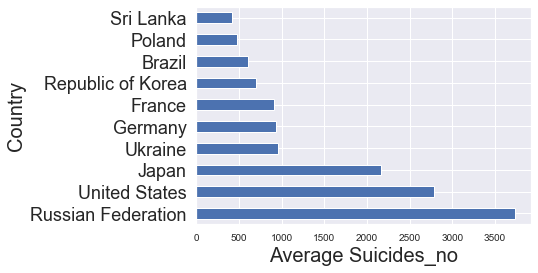

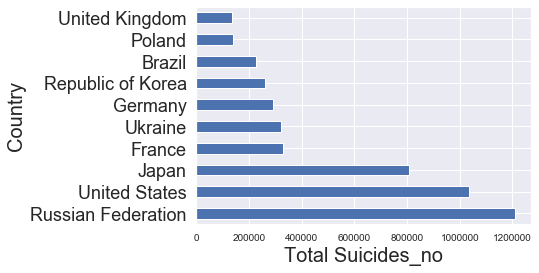

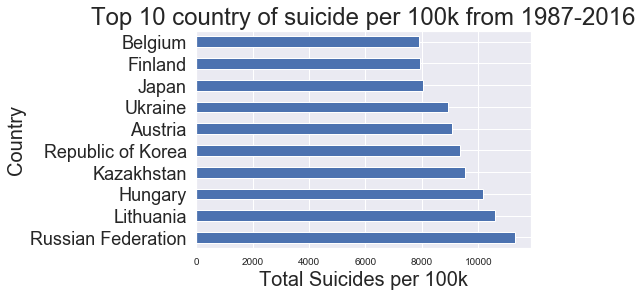

In [169]:
import matplotlib.pyplot as plt

data2.groupby(['country']).suicides_no.mean().nlargest(10).plot(kind='barh')
plt.xlabel('Average Suicides_no', size=20)
plt.ylabel('Country', fontsize=20);
plt.show()
plt.clf()
plt.cla()
plt.close()


data2.groupby(['country']).suicides_no.sum().nlargest(10).plot(kind='barh')
plt.xlabel('Total Suicides_no', size=20)
plt.ylabel('Country', fontsize=20);
plt.show()
plt.clf()
plt.cla()
plt.close()


data2.groupby(['country']).suicides_100k_pop.sum().nlargest(10).plot(kind='barh')
plt.title('Top 10 country of suicide per 100k from 1987-2016')
plt.xlabel('Total Suicides per 100k', size=20)
plt.ylabel('Country', fontsize=20);
plt.show()
plt.clf()
plt.cla()
plt.close()

In [170]:
data2.columns = [c.replace('$', '').replace('(', '').replace(')', '').strip().replace(' ', '_').replace('/','_') for c in data2.columns]


In [171]:
#Print all countries
countries = data2.country.unique()
#print(countries)


Text(0, 0.5, 'Total number of suicides in the world')

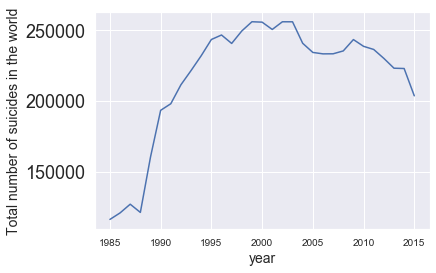

In [172]:
year = data2.groupby('year').year.unique()



totalpyear = pd.DataFrame(data2.groupby('year').suicides_no.sum())

plt.plot(year.index[0:31], totalpyear[0:31])
plt.xlabel('year', fontsize=14)
plt.ylabel('Total number of suicides in the world', fontsize=14)

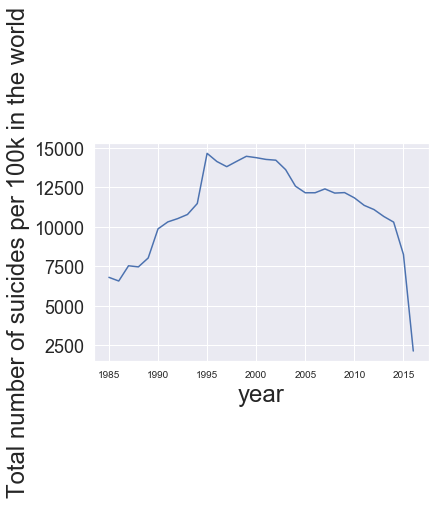

In [173]:
year = data2.groupby('year').year.unique()



totalpyear = pd.DataFrame(data2.groupby('year').suicides_100k_pop.sum())
#plt.figure(9)
plt.plot(year.index, totalpyear)
plt.xlabel('year')
plt.ylabel('Total number of suicides per 100k in the world')
plt.show()
plt.clf()
plt.cla()
plt.close()

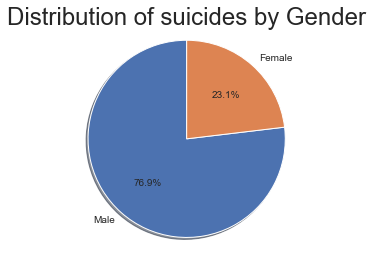

In [174]:
labels = 'Male', 'Female'
values = [np.sum(data2[data2.sex.eq("male")].suicides_no), np.sum(data2[data2.sex.eq("female")].suicides_no)]
fig1, ax1 = plt.subplots()
ax1.pie(values,  labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title('Distribution of suicides by Gender')
plt.show()
plt.clf()
plt.cla()
plt.close()

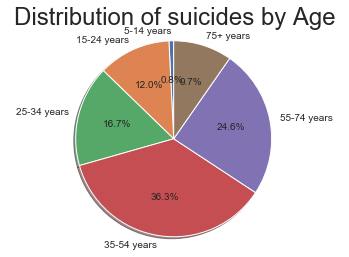

In [175]:
labels = '5-14 years', '15-24 years','25-34 years','35-54 years','55-74 years','75+ years'
values =[]
for eachlab in labels:
    values.append(np.sum(data2[data2.age.eq(eachlab)].suicides_no))

fig1, ax1 = plt.subplots()
ax1.pie(values,  labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title('Distribution of suicides by Age')
plt.show()
plt.clf()
plt.cla()
plt.close()

population


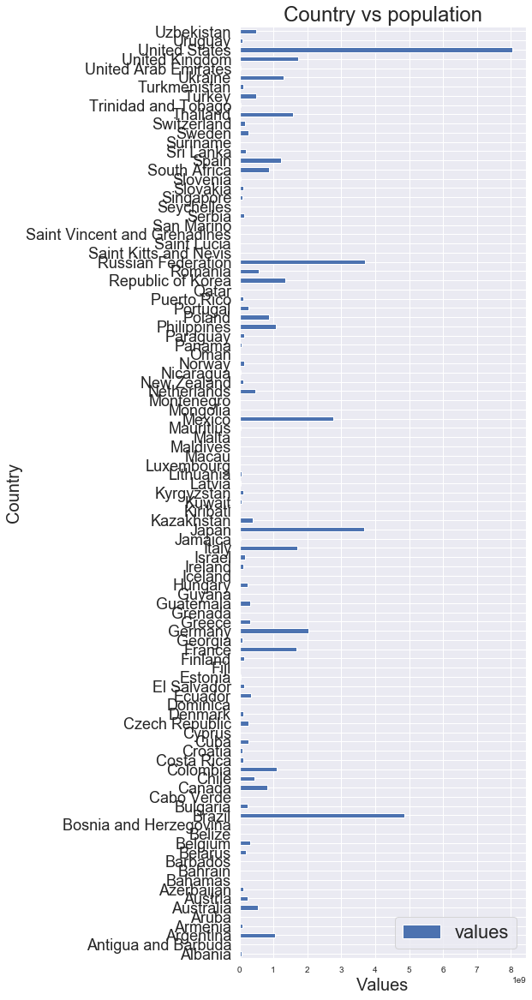

<Figure size 14400x720 with 0 Axes>

In [176]:
countries = data2['country'].unique()

data2.columns = [c.replace('$', '').replace('(', '').replace(')', '').strip().replace(' ', '_') for c in data2.columns]


        #print(data2[data2.country.eq(eachcon)].population)

from matplotlib.pyplot import figure

def getvalofcountries(data, column_key):
    print(column_key)
    values = []
    for eachcon in countries:
        if column_key == 'population':
            values.append(np.sum(data2[data2.country.eq(eachcon)].population))
        elif column_key == 'HDI_for_year':
            values.append(float(data2[data2.country.eq(eachcon)].HDI_for_year.iloc[0]))
        elif column_key == 'gdp_for_year':
            values.append(float(data2[data2.country.eq(eachcon)].gdp_for_year.iloc[0]))

    df = pd.DataFrame(values, index = countries,columns =['values'])
    df = df[(df.values != 0)] # remove empty values
    df.plot(kind='barh',figsize=(6,20))
    plt.xlabel('Values', size=20)
    plt.ylabel('Country', fontsize=20)
    plt.title("Country vs "+column_key)
    #plt.show()
    figure(figsize=(200,10))
    plt.show()
    plt.clf()
    plt.cla()
    plt.close()
    

getvalofcountries(data2,'population')



HDI_for_year


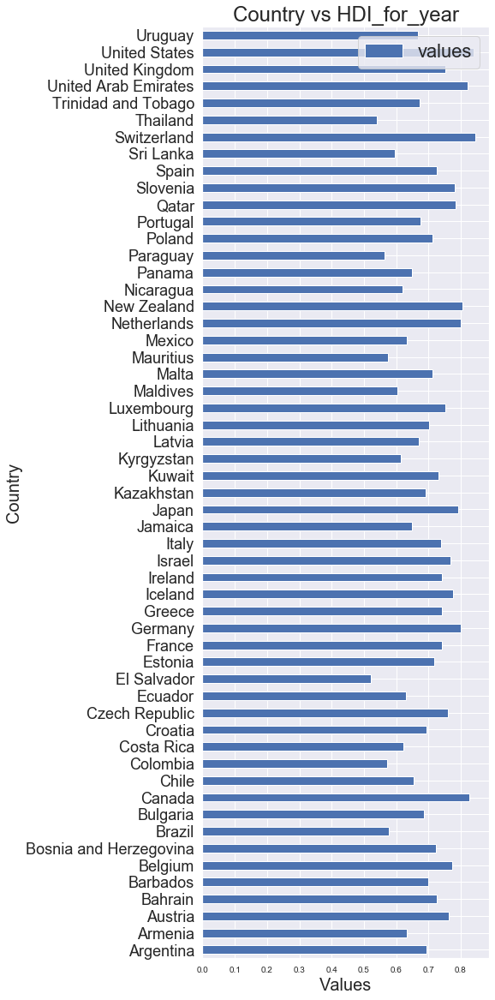

<Figure size 14400x720 with 0 Axes>

In [177]:
getvalofcountries(data2,'HDI_for_year')

gdp_for_year


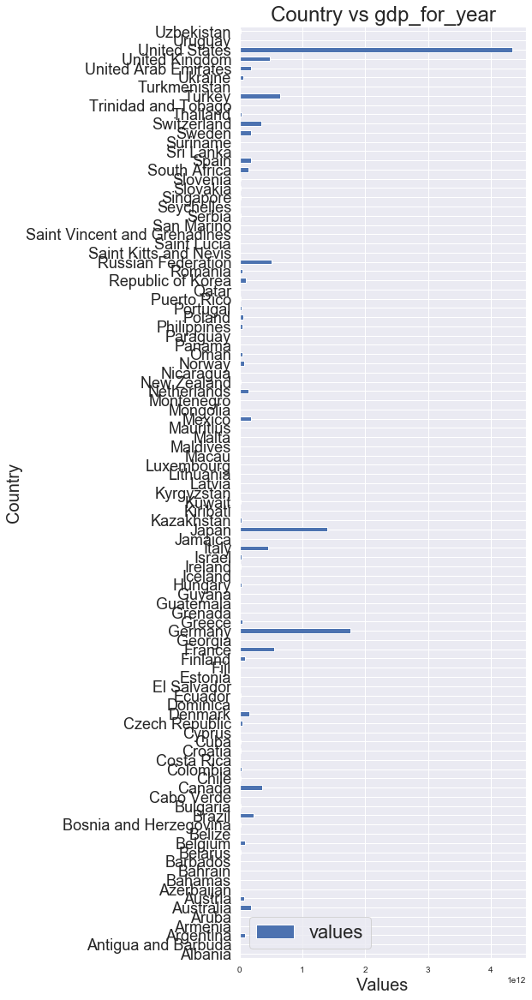

<Figure size 14400x720 with 0 Axes>

In [178]:
getvalofcountries(data2,'gdp_for_year')

## Phase 2

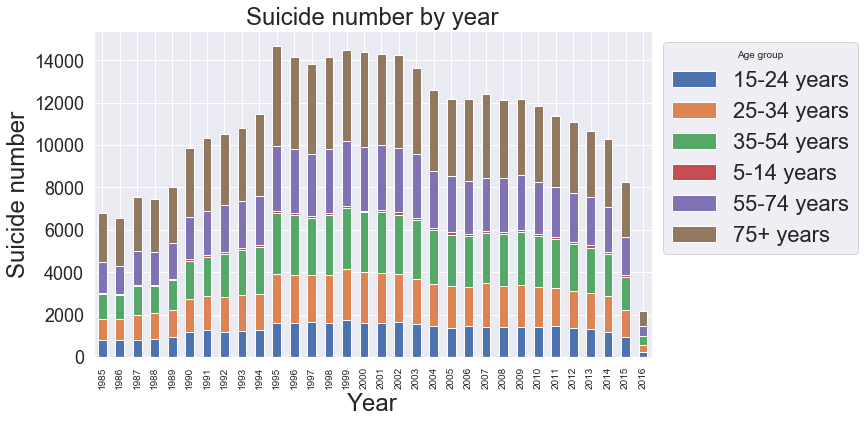

In [179]:
#Total suicide number by year
gsdtt=pd.DataFrame(data2.groupby(['age','year'])['suicides_100k_pop'].sum().unstack())
gsdtt = gsdtt.fillna(0)
gsdtt


Tgsdtt = gsdtt.T
Tgsdtt.ix[:,:].plot(kind='bar',stacked = True, figsize=(10,6))
plt.legend(bbox_to_anchor=(1,1), title = 'Age group')
plt.title('Suicide number by year')
plt.xlabel('Year')
plt.ylabel('Suicide number')
warnings.filterwarnings('ignore')
plt.show()
plt.clf()
plt.cla()
plt.close()

In [180]:
#Group data by age gender of each year
gsd=pd.DataFrame(data2.groupby(['age','sex','year'])['suicides_no'].sum().unstack())
gsd = gsd.fillna(0)
gsd

#male
gsdm = pd.DataFrame(gsd.iloc[[1,3,5,7,9,11],:])
gsdm

#female
gsdf = pd.DataFrame(gsd.iloc[[0,2,4,6,8,10],:])
gsdf

,year,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
age,sex,,,,,,,,,,,,,,,,,,,,,
15-24 years,female,4690.0,4821.0,4046.0,3447.0,4004.0,5308.0,5034.0,5448.0,5181.0,5372.0,...,5876.0,6163.0,6371.0,6164.0,6468.0,5940.0,5666.0,5452.0,5029.0,238.0
25-34 years,female,4894.0,5058.0,4923.0,4468.0,5422.0,6772.0,6486.0,6830.0,6812.0,6846.0,...,7254.0,7387.0,7596.0,7363.0,7437.0,7080.0,6719.0,6871.0,6265.0,373.0
35-54 years,female,9476.0,10047.0,10551.0,10014.0,12246.0,14622.0,14824.0,15840.0,15947.0,16238.0,...,17989.0,18408.0,18751.0,18468.0,18344.0,17986.0,17524.0,17424.0,15876.0,1232.0
5-14 years,female,351.0,303.0,271.0,244.0,308.0,384.0,379.0,455.0,479.0,475.0,...,585.0,628.0,724.0,675.0,748.0,608.0,719.0,761.0,693.0,0.0
55-74 years,female,9057.0,9308.0,10373.0,9869.0,12727.0,14891.0,14887.0,15129.0,15288.0,15129.0,...,14004.0,13878.0,14216.0,14297.0,14227.0,14071.0,13810.0,13926.0,12881.0,1119.0
75+ years,female,4011.0,4315.0,4842.0,4973.0,6654.0,8141.0,8012.0,7865.0,7624.0,7472.0,...,7616.0,7509.0,7262.0,7255.0,7392.0,7326.0,7021.0,7122.0,6504.0,542.0


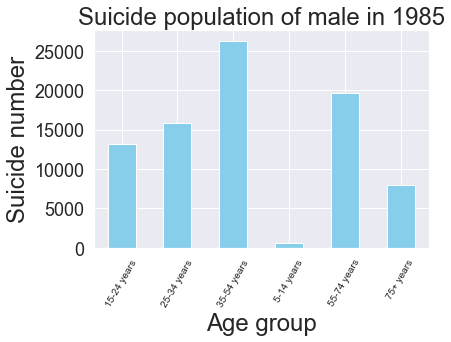

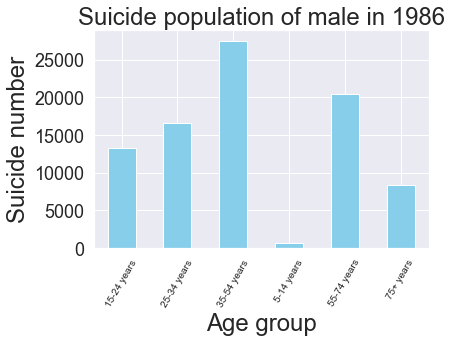

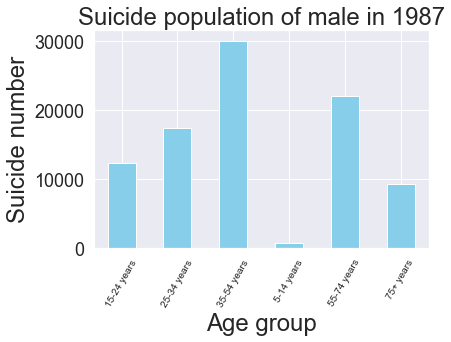

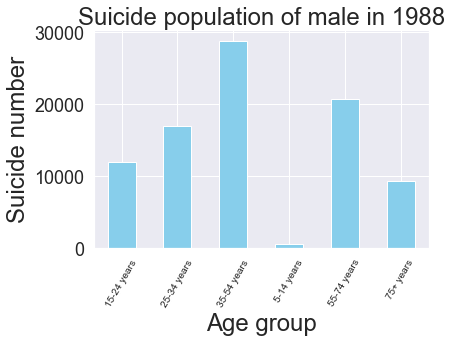

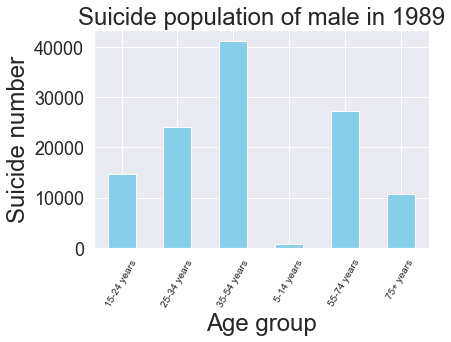

...

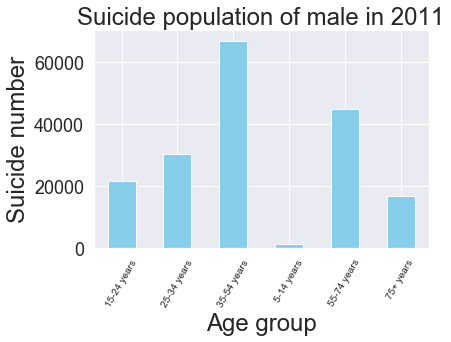

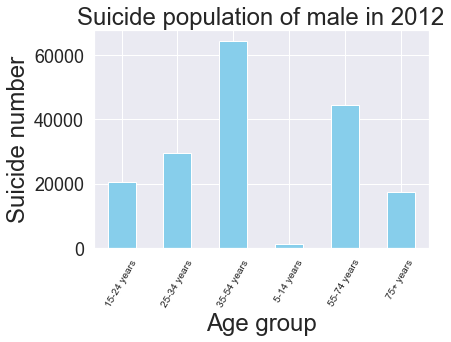

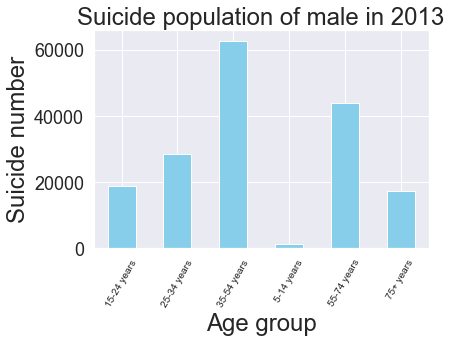

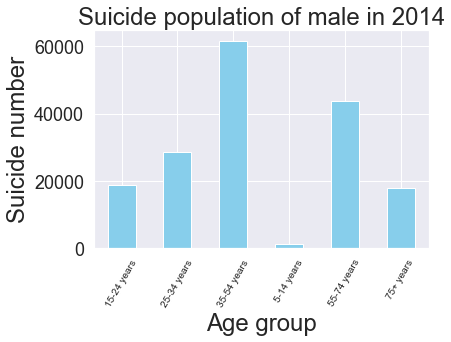

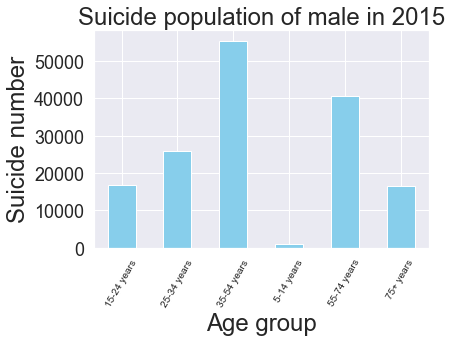

In [181]:
#Suicide population for male
for i in range(1985,2016):
    gsdm.ix[:,i].plot(kind='bar', color = ('skyblue'))
    plt.xticks(range(6),['15-24 years','25-34 years', '35-54 years', '5-14 years', '55-74 years', '75+ years'],
               rotation = 60)
    plt.xlabel('Age group')
    plt.ylabel('Suicide number')
    plt.title('Suicide population of male in '+ str(i))
    
    plt.show()
    plt.clf()
    plt.cla()
    plt.close()

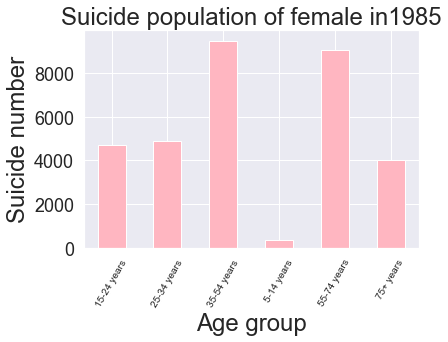

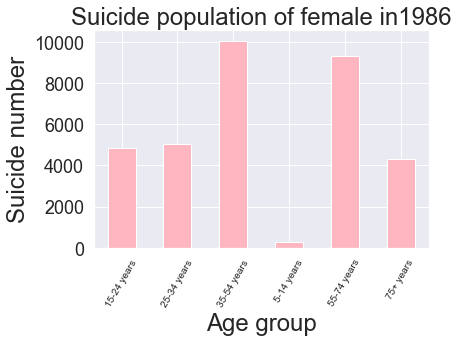

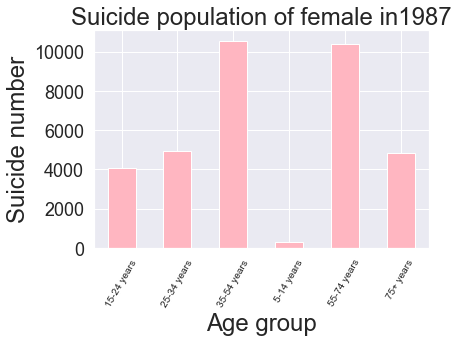

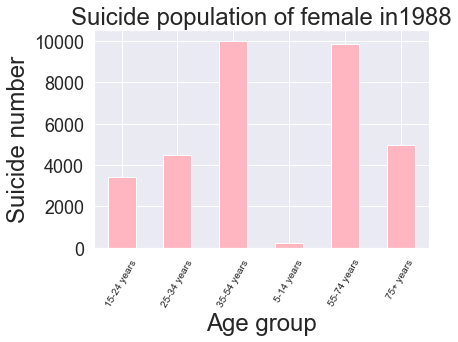

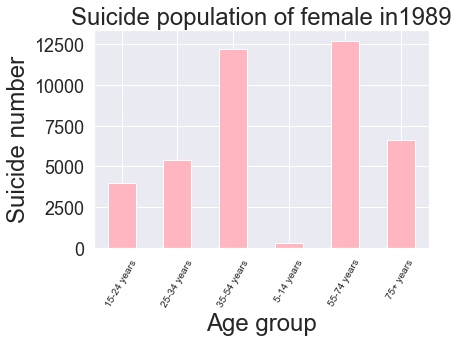

...

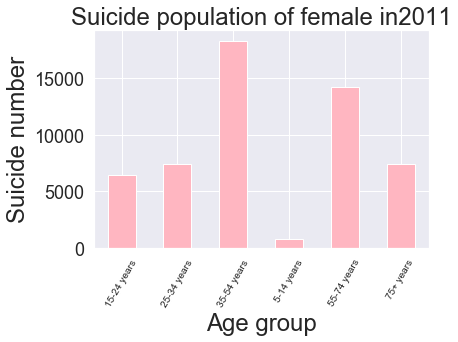

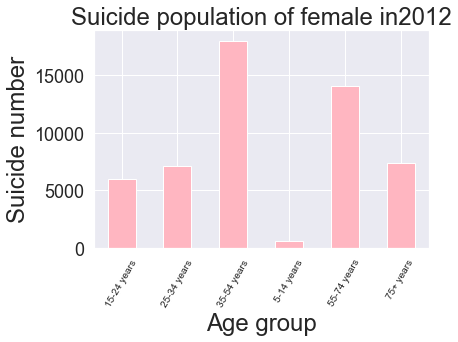

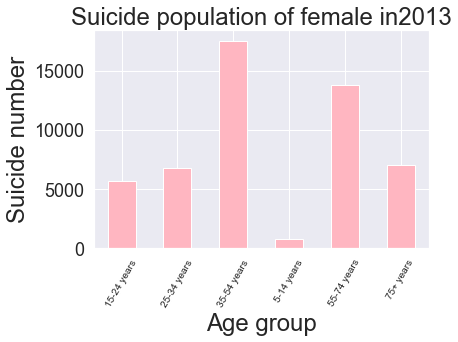

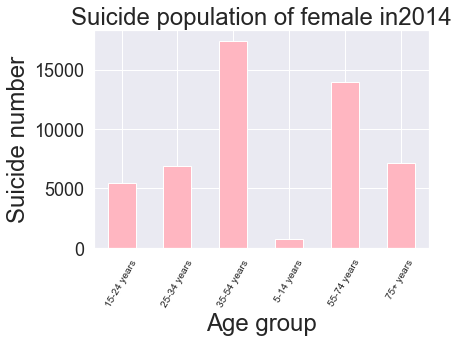

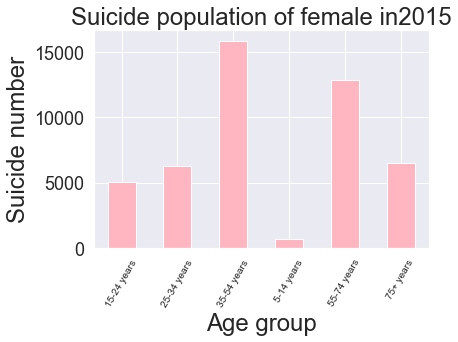

In [182]:


#Suicide population for female
for i in range(1985,2016):
    gsdf.ix[:,i].plot(kind='bar', color = ('lightpink'))
    plt.xticks(range(6),['15-24 years','25-34 years', '35-54 years', '5-14 years', '55-74 years', '75+ years'],rotation = 60)
    plt.xlabel('Age group')
    plt.ylabel('Suicide number')
    plt.title('Suicide population of female in'+ str(i))
    
    plt.show()
    plt.clf()
    plt.cla()
    plt.close()



In [183]:
#Total number by age group
gsd02=pd.DataFrame(data2.groupby(['age','sex'])['suicides_no'].sum().unstack())
gsd02
gsd02_02 = pd.DataFrame(gsd02.T.sum())
gsd02_02

,0
age,
15-24 years,808542
25-34 years,1123912
35-54 years,2452141
5-14 years,52264
55-74 years,1658443
75+ years,653118


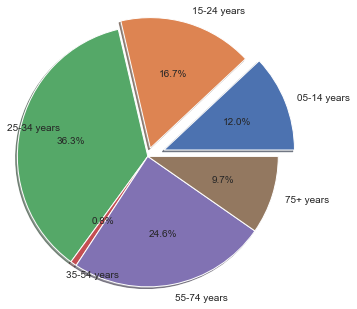

In [184]:


#Pie chart by age group

age=['05-14 years','15-24 years','25-34 years','35-54 years','55-74 years','75+ years']
plt.pie(gsd02_02,
               labels = age,
               autopct = '%.1f%%',
               startangle =0,
               radius = 1.5,
               frame = 0,
               center = (4.5,4.5),
               explode=(0.2,0.1,0,0,0,0),
               shadow=True
               )
plt.show()
plt.clf()
plt.cla()
plt.close()


In [185]:
#Total by gender
sexsum = gsd02
sexsum = pd.DataFrame(sexsum.sum())
sexsum = sexsum.reset_index()
sexsum

,sex,0
0,female,1559510
1,male,5188910


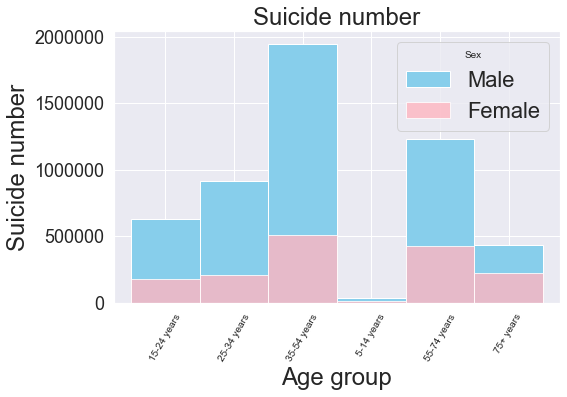

In [186]:
#Compare the suicide number of male and female
gsd02.ix[:,1].plot(kind='bar', color='skyblue', width = 1, figsize=(8,5))
gsd02.ix[:,0].plot(kind='bar', color='lightpink', width = 1, alpha = 0.8,figsize=(8,5))
plt.ylabel('Suicide number')
plt.xlabel('Age group')
plt.xticks(rotation = 60)
plt.title('Suicide number')
plt.legend(['Male','Female'], bbox_to_anchor=(1, 1),title = 'Sex')
plt.show()
plt.clf()
plt.cla()
plt.close()

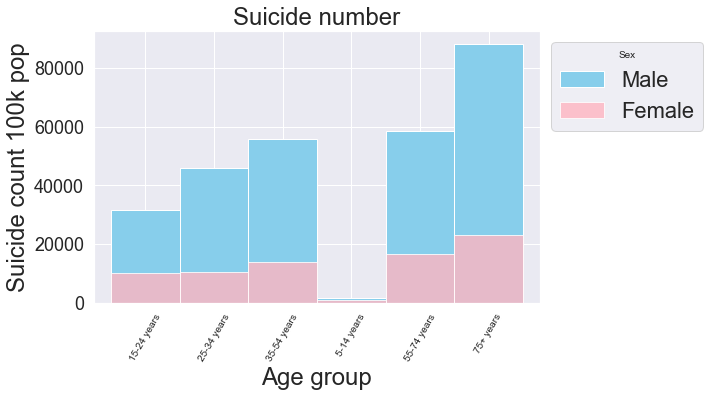

In [187]:
#Total number by age group
gsd03=pd.DataFrame(data2.groupby(['age','sex'])['suicides_100k_pop'].sum().unstack())
gsd03
gsd03_02 = pd.DataFrame(gsd03.T.sum())
gsd03_02

#Compare the suicide number of male and female
gsd03.ix[:,1].plot(kind='bar', color='skyblue', width = 1, figsize=(8,5))
gsd03.ix[:,0].plot(kind='bar', color='lightpink', width = 1, alpha = 0.8,figsize=(8,5))
plt.ylabel('Suicide count 100k pop')
plt.xlabel('Age group')
plt.xticks(rotation = 60)
plt.title('Suicide number')
plt.legend(['Male','Female'], bbox_to_anchor=(1, 1),title = 'Sex')
plt.show()
plt.clf()
plt.cla()
plt.close()

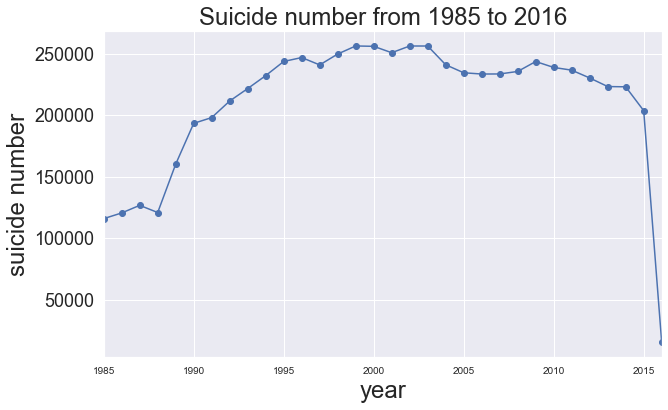

In [188]:
#Plot by year (line)
gsd_year=pd.DataFrame(data2.groupby(['year','country'])['suicides_no'].sum().unstack())
gsd_year = gsd_year.fillna(0)
gsd_year['Suicide number'] = gsd_year.sum(axis=1)

gsd_year.ix[:,'Suicide number'].plot(kind='line',figsize=(10,6),marker='o')
plt.title('Suicide number from 1985 to 2016')
plt.xlabel('year')
plt.ylabel('suicide number')
plt.show()
plt.clf()
plt.cla()
plt.close()

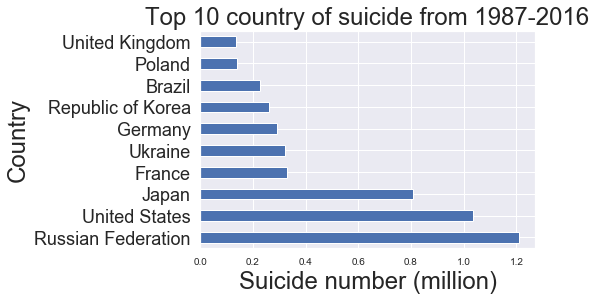

In [189]:


#Group data by country (absolute)
gsdcountry= (pd.DataFrame(data2.groupby(['country','sex'])['suicides_no'].sum().unstack()))/1000000
gsdcountry['Suicide number']=gsdcountry.apply(lambda gsdcountry: gsdcountry['female']+gsdcountry['male'], axis = 1)
gsdcountry = gsdcountry.sort_values(by='Suicide number',ascending=False)
gsdcountry.head(10)

gsdcountry.ix[0:10,2].plot(kind='barh')
plt.ylabel('Country')
plt.xlabel('Suicide number (million)')
plt.title('Top 10 country of suicide from 1987-2016')

plt.show()
plt.clf()
plt.cla()
plt.close()


In [190]:
#Original suicide number data
gsdcountrynormal = gsdcountry*1000000
gsdcountrynormal = pd.DataFrame(gsdcountrynormal['Suicide number'])
gsdcountrynormal = gsdcountrynormal.reset_index()
gsdcountrynormal

,country,Suicide number
0,Russian Federation,1209742.0
1,United States,1034013.0
2,Japan,806902.0
3,France,329127.0
4,Ukraine,319950.0
5,Germany,291262.0
6,Republic of Korea,261730.0
7,Brazil,226613.0
8,Poland,139098.0
9,United Kingdom,136805.0


### Choropleth maps

In [191]:
py.sign_in('hbin7552', 'kI7QRK2ZvMwh5vSJP9az')
print(plotly.__version__)

#Draw a choropleth map of world to show the suicide numnber by country
plotly.offline.init_notebook_mode()

#data to graph
my_data = [dict(type='choropleth', 
        autocolorscale=True,
        locations=gsdcountrynormal['country'],
        z=gsdcountrynormal['Suicide number'].astype(float),
        locationmode='country names',
        text=gsdcountrynormal['country'],
        hoverinfo='location+z',
        marker=dict(line=dict(color='rgb(180,180,180)',width=0.5)),
        colorbar=dict(title='Suicide number'))]

#layout
my_layout = dict(title='Suicide number',
                 geo=dict(scope='world',
                          projection=dict(type='mercator'),
                          showcoastlines= False,
                          showframe= False))

fig = dict(data=my_data, layout=my_layout)
py.iplot(fig, validata=False, filename='Suicide number')



4.7.1


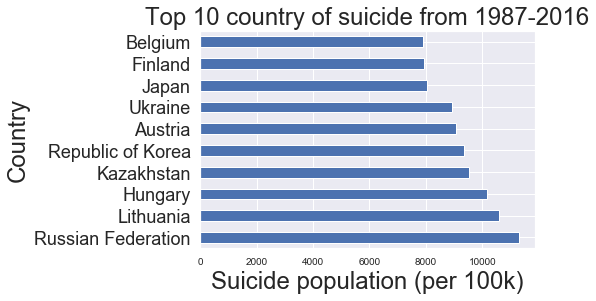

In [192]:


#Group data by country (per 100k)
gsdcountryper= pd.DataFrame(data2.groupby(['country','sex'])['suicides_100k_pop'].sum().unstack())
gsdcountryper['Suicide number']=gsdcountryper.apply(lambda gsdcountryper: gsdcountryper['female']
                                                    +gsdcountryper['male'], axis = 1)
gsdcountryper = gsdcountryper.sort_values(by='Suicide number',ascending=False)
gsdcountryper.head(10)

gsdcountryper.ix[0:10,2].plot(kind='barh')
plt.ylabel('Country')
plt.xlabel('Suicide population (per 100k)')
plt.title('Top 10 country of suicide from 1987-2016')

plt.show()
plt.clf()
plt.cla()
plt.close()


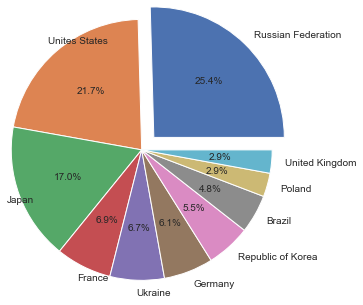

In [193]:


#Top ten suicide country by percentage
gsdcountry10 = pd.DataFrame(gsdcountry.ix[0:10,2])

top10country = ["Russian Federation","Unites States","Japan","France","Ukraine","Germany","Republic of Korea","Brazil","Poland","United Kingdom"]

plt.pie(gsdcountry10,
               labels = top10country,
               autopct = '%.1f%%',
               startangle =0,
               radius = 1.5,
               frame = 0,
               center = (4.5,4.5),
               explode=(0.2,0,0,0,0,0,0,0,0,0)
               )
plt.show()
plt.clf()
plt.cla()
plt.close()


### GDP of countries

In [194]:

        #print(data2[data2.country.eq(eachcon)].population)
years = data2['year'].unique()

values2 = []

gdp_df = pd.DataFrame(columns=['country','gdp','gdp_per_capita'])
gdp_df = gdp_df.fillna(0)


for eachcon in countries:
    #print("--------------------------")
    #print(eachcon)
    gdp_for_country = 0
    gdp_for_every_year = []
    gdp_per_capita_every_year = []
    for eachyear in years:
                    #print(eachyear)
                    try:
                        gdp_for_country +=float(data2[data2.country.eq(eachcon) & data2.year.eq(eachyear)].gdp_for_year.iloc[0])
                        gdp_for_every_year.append(float(data2[data2.country.eq(eachcon) & data2.year.eq(eachyear)].gdp_for_year.iloc[0]))
                        #print(float(data2[data2.country.eq(eachcon) & data2.year.eq(eachyear)].gdp_per_capita.iloc[0]))
                        gdp_per_capita_every_year.append(float(data2[data2.country.eq(eachcon) & data2.year.eq(eachyear)].gdp_per_capita.iloc[0]))
                    except Exception as e:
                        #print(e)
                        print("Info : GDP for",eachcon,eachyear,"not found")
    #print(gdp_for_country)
    gdp_df = gdp_df.append({'country' : eachcon , 'gdp' : np.average(gdp_for_every_year),'gdp_per_capita':np.average(gdp_per_capita_every_year)} , ignore_index=True)

Info : GDP for Albania 1985 not found
Info : GDP for Albania 1986 not found
Info : GDP for Albania 1990 not found
Info : GDP for Albania 1991 not found
Info : GDP for Albania 2012 not found
Info : GDP for Albania 2013 not found
Info : GDP for Albania 2014 not found
Info : GDP for Albania 2015 not found
Info : GDP for Albania 2011 not found
Info : GDP for Albania 2016 not found
Info : GDP for Antigua and Barbuda 1996 not found
Info : GDP for Antigua and Barbuda 1997 not found
Info : GDP for Antigua and Barbuda 2010 not found
Info : GDP for Antigua and Barbuda 2011 not found
Info : GDP for Antigua and Barbuda 2016 not found
Info : GDP for Argentina 2016 not found
Info : GDP for Armenia 1987 not found
Info : GDP for Armenia 1988 not found
Info : GDP for Armenia 1989 not found
Info : GDP for Armenia 2004 not found
Info : GDP for Armenia 2005 not found
Info : GDP for Armenia 1985 not found
Info : GDP for Armenia 1986 not found
Info : GDP for Aruba 1987 not found
Info : GDP for Aruba 1988 no

Info : GDP for Cyprus 2001 not found
Info : GDP for Cyprus 2002 not found
Info : GDP for Cyprus 2003 not found
Info : GDP for Cyprus 1985 not found
Info : GDP for Cyprus 1986 not found
Info : GDP for Cyprus 1990 not found
Info : GDP for Cyprus 1991 not found
Info : GDP for Czech Republic 1987 not found
Info : GDP for Czech Republic 1988 not found
Info : GDP for Czech Republic 1989 not found
Info : GDP for Czech Republic 1985 not found
Info : GDP for Czech Republic 1986 not found
Info : GDP for Denmark 1987 not found
Info : GDP for Denmark 1988 not found
Info : GDP for Denmark 1989 not found
Info : GDP for Denmark 1992 not found
Info : GDP for Denmark 1993 not found
Info : GDP for Denmark 1985 not found
Info : GDP for Denmark 1986 not found
Info : GDP for Denmark 1990 not found
Info : GDP for Denmark 1991 not found
Info : GDP for Denmark 2016 not found
Info : GDP for Dominica 1987 not found
Info : GDP for Dominica 1988 not found
Info : GDP for Dominica 1989 not found
Info : GDP for Domi

Info : GDP for Lithuania 1985 not found
Info : GDP for Lithuania 1986 not found
Info : GDP for Lithuania 1990 not found
Info : GDP for Lithuania 1991 not found
Info : GDP for Luxembourg 2016 not found
Info : GDP for Macau 1987 not found
Info : GDP for Macau 1988 not found
Info : GDP for Macau 1989 not found
Info : GDP for Macau 1992 not found
Info : GDP for Macau 1993 not found
Info : GDP for Macau 1995 not found
Info : GDP for Macau 1996 not found
Info : GDP for Macau 1997 not found
Info : GDP for Macau 1998 not found
Info : GDP for Macau 1999 not found
Info : GDP for Macau 2000 not found
Info : GDP for Macau 2001 not found
Info : GDP for Macau 2002 not found
Info : GDP for Macau 2003 not found
Info : GDP for Macau 2004 not found
Info : GDP for Macau 2005 not found
Info : GDP for Macau 2006 not found
Info : GDP for Macau 2007 not found
Info : GDP for Macau 2008 not found
Info : GDP for Macau 2009 not found
Info : GDP for Macau 2010 not found
Info : GDP for Macau 1985 not found
Info : 

Info : GDP for Portugal 2015 not found
Info : GDP for Portugal 2016 not found
Info : GDP for Puerto Rico 2016 not found
Info : GDP for Qatar 1987 not found
Info : GDP for Qatar 1988 not found
Info : GDP for Qatar 1989 not found
Info : GDP for Qatar 1992 not found
Info : GDP for Qatar 1993 not found
Info : GDP for Qatar 1994 not found
Info : GDP for Qatar 1996 not found
Info : GDP for Qatar 1997 not found
Info : GDP for Qatar 1998 not found
Info : GDP for Qatar 1999 not found
Info : GDP for Qatar 2000 not found
Info : GDP for Qatar 2002 not found
Info : GDP for Qatar 2003 not found
Info : GDP for Qatar 1985 not found
Info : GDP for Qatar 1986 not found
Info : GDP for Qatar 1990 not found
Info : GDP for Qatar 1991 not found
Info : GDP for Republic of Korea 2016 not found
Info : GDP for Romania 1987 not found
Info : GDP for Romania 1988 not found
Info : GDP for Romania 1985 not found
Info : GDP for Romania 1986 not found
Info : GDP for Russian Federation 1987 not found
Info : GDP for Russ

Info : GDP for Switzerland 1985 not found
Info : GDP for Switzerland 1986 not found
Info : GDP for Switzerland 1990 not found
Info : GDP for Switzerland 1991 not found
Info : GDP for Switzerland 2016 not found
Info : GDP for Thailand 1988 not found
Info : GDP for Thailand 1989 not found
Info : GDP for Thailand 1993 not found
Info : GDP for Thailand 2001 not found
Info : GDP for Trinidad and Tobago 2012 not found
Info : GDP for Trinidad and Tobago 2013 not found
Info : GDP for Trinidad and Tobago 2014 not found
Info : GDP for Trinidad and Tobago 2015 not found
Info : GDP for Trinidad and Tobago 2016 not found
Info : GDP for Turkey 1987 not found
Info : GDP for Turkey 1988 not found
Info : GDP for Turkey 1989 not found
Info : GDP for Turkey 1992 not found
Info : GDP for Turkey 1993 not found
Info : GDP for Turkey 1994 not found
Info : GDP for Turkey 1995 not found
Info : GDP for Turkey 1996 not found
Info : GDP for Turkey 1997 not found
Info : GDP for Turkey 1998 not found
Info : GDP for

In [195]:
gdp_df.head()

,country,gdp,gdp_per_capita
0,Albania,5.211661e+09,1859.045455
1,Antigua and Barbuda,8.035452e+08,10448.185185
2,Argentina,2.742565e+11,7914.096774
3,Armenia,5.420989e+09,1886.680000
4,Aruba,2.196223e+09,24221.642857


In [196]:


#Draw a choropleth map of world to show the GDP by country
plotly.offline.init_notebook_mode()

colorscale = [[0,"#f7fbff"], 
              [0.1,"#ebf3fb"], 
              [0.2,"#deebf7"], 
              [0.3,"#d2e3f3"], 
              [0.4,"#c6dbef"], 
              [0.45,"#b3d2e9"], 
              [0.5,"#9ecae1"],
              [0.55,"#85bcdb"],
              [0.6,"#6baed6"], 
              [0.65,"#57a0ce"], 
              [0.7,"#4292c6"],
              [0.75,"#3082be"],
              [0.8,"#2171b5"],
              [0.85,"#1361a9"],
              [0.9,"#08519c"],
              [0.95,"#0b4083"],
              [1.0,"#08306b"]]


#data to graph
my_data01 = [dict(type='choropleth', 
        colorscale=colorscale,
        locations=gdp_df['country'],
        z=gdp_df['gdp'],
        locationmode='country names',
        text=gdp_df['country'],
        hoverinfo='location+z',
        marker=dict(line=dict(color='rgb(180,180,180)',width=0.5)),
        colorbar=dict(title='GDP'))]

#layout
my_layout01 = dict(title='GDP',
                 geo=dict(scope='world',
                          projection=dict(type='mercator'),
                          showcoastlines= False,
                          showframe= False))

fig = dict(data=my_data01, layout=my_layout01)
py.iplot(fig, validata=False, filename='GDP')



In [197]:
gdp_df.head()


,country,gdp,gdp_per_capita
0,Albania,5.211661e+09,1859.045455
1,Antigua and Barbuda,8.035452e+08,10448.185185
2,Argentina,2.742565e+11,7914.096774
3,Armenia,5.420989e+09,1886.680000
4,Aruba,2.196223e+09,24221.642857


In [198]:


#Draw a choropleth map of world to show the GDP by country
plotly.offline.init_notebook_mode()

colorscale = [[0,"#f7fbff"], 
              [0.1,"#ebf3fb"], 
              [0.2,"#deebf7"], 
              [0.3,"#d2e3f3"], 
              [0.4,"#c6dbef"], 
              [0.45,"#b3d2e9"], 
              [0.5,"#9ecae1"],
              [0.55,"#85bcdb"],
              [0.6,"#6baed6"], 
              [0.65,"#57a0ce"], 
              [0.7,"#4292c6"],
              [0.75,"#3082be"],
              [0.8,"#2171b5"],
              [0.85,"#1361a9"],
              [0.9,"#08519c"],
              [0.95,"#0b4083"],
              [1.0,"#08306b"]]


#data to graph
my_data01 = [dict(type='choropleth', 
        colorscale=colorscale,
        locations=gdp_df['country'],
        z=gdp_df['gdp_per_capita'],
        locationmode='country names',
        text=gdp_df['country'],
        hoverinfo='location+z',
        marker=dict(line=dict(color='rgb(180,180,180)',width=0.5)),
        colorbar=dict(title='GDP per capita'))]

#layout
my_layout01 = dict(title='GDP per capita',
                 geo=dict(scope='world',
                          projection=dict(type='mercator'),
                          showcoastlines= False,
                          showframe= False))

fig = dict(data=my_data01, layout=my_layout01)
py.iplot(fig, validata=False, filename='GDP per capita')



### Suicide count

In [199]:
gsdcountry

sex,female,male,Suicide number
country,,,
Russian Federation,0.214330,0.995412,1.209742
United States,0.213797,0.820216,1.034013
Japan,0.251630,0.555272,0.806902
France,0.089419,0.239708,0.329127
Ukraine,0.061377,0.258573,0.319950
Germany,0.079707,0.211555,0.291262
Republic of Korea,0.082615,0.179115,0.261730
Brazil,0.049015,0.177598,0.226613
Poland,0.021063,0.118035,0.139098


In [200]:
#print(list(data2.groupby(['country']).suicides_100k_pop.sum().to_frame().suicides_100k_pop))
gdp_df['suicides_100k_pop'] = list(data2.groupby(['country']).suicides_100k_pop.sum().to_frame().suicides_100k_pop)
gdp_df['suicides_no'] = list(data2.groupby(['country']).suicides_no.sum().to_frame().suicides_no)

len(gdp_df)

101

In [201]:
print(gdp_df.head())

               country           gdp  gdp_per_capita  suicides_100k_pop  \
0              Albania  5.211661e+09     1859.045455             924.76   
1  Antigua and Barbuda  8.035452e+08    10448.185185             179.14   
2            Argentina  2.742565e+11     7914.096774            3894.59   
3              Armenia  5.420989e+09     1886.680000             976.21   
4                Aruba  2.196223e+09    24221.642857            1596.52   

   suicides_no  
0         1970  
1           11  
2        82219  
3         1905  
4          101  


### Relationship analysis

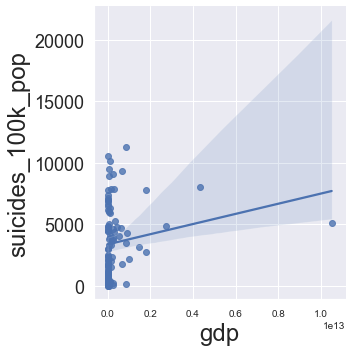

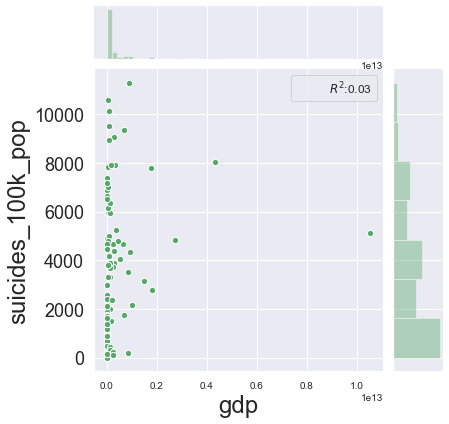

In [202]:
#The correlation between perGDP vs suicide number
sns.lmplot(x = "gdp",y = "suicides_100k_pop",
                 data = gdp_df)

g = sns.JointGrid(x = "gdp",y = "suicides_100k_pop",
                 data = gdp_df)
g = g.plot_joint(plt.scatter,
               color="g",s=40,edgecolor="white")
g=g.plot_marginals(sns.distplot, kde=False, color="g")
rsquare = lambda a,b: stats.pearsonr(a,b)[0]**2
g = g.annotate(rsquare, template="{stat}:{val:.2f}",
              stat="$R^2$",loc= "upper right", fontsize=12)

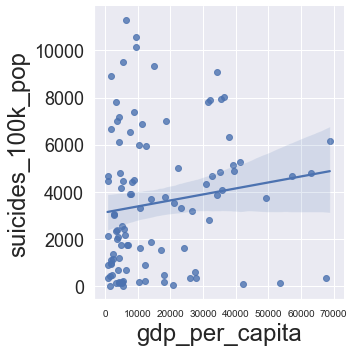

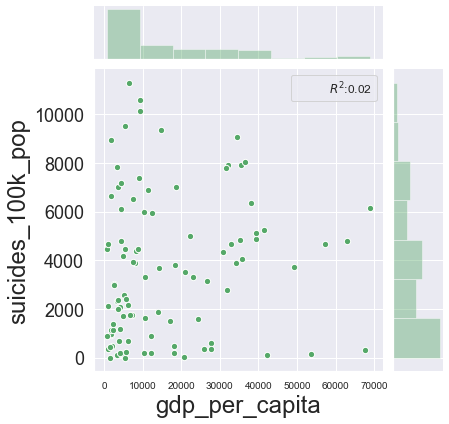

In [203]:
#The correlation between perGDP vs suicide number
sns.lmplot(x = "gdp_per_capita",y = "suicides_100k_pop",
                 data = gdp_df)

g = sns.JointGrid(x = "gdp_per_capita",y = "suicides_100k_pop",
                 data = gdp_df)
g = g.plot_joint(plt.scatter,
               color="g",s=40,edgecolor="white")
g=g.plot_marginals(sns.distplot, kde=False, color="g")
rsquare = lambda a,b: stats.pearsonr(a,b)[0]**2
g = g.annotate(rsquare, template="{stat}:{val:.2f}",
              stat="$R^2$",loc= "upper right", fontsize=12)

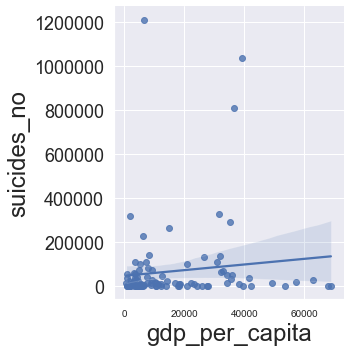

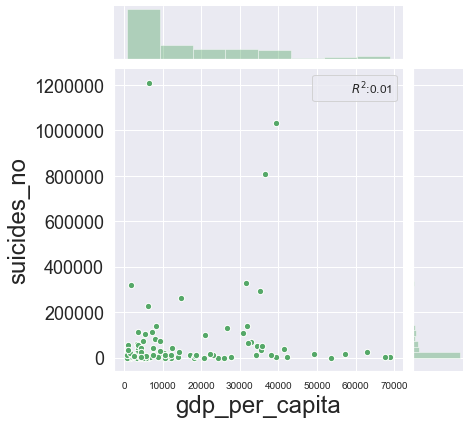

In [204]:
#The correlation between perGDP vs suicide number
sns.lmplot(x = "gdp_per_capita",y = "suicides_no",
                 data = gdp_df)

g = sns.JointGrid(x = "gdp_per_capita",y = "suicides_no",
                 data = gdp_df)
g = g.plot_joint(plt.scatter,
               color="g",s=40,edgecolor="white")
g=g.plot_marginals(sns.distplot, kde=False, color="g")
rsquare = lambda a,b: stats.pearsonr(a,b)[0]**2
g = g.annotate(rsquare, template="{stat}:{val:.2f}",
              stat="$R^2$",loc= "upper right", fontsize=12)

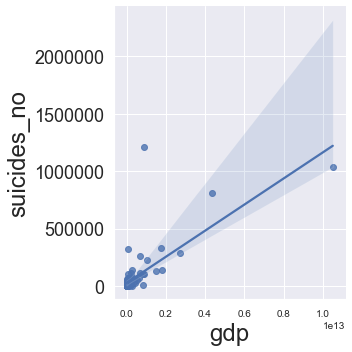

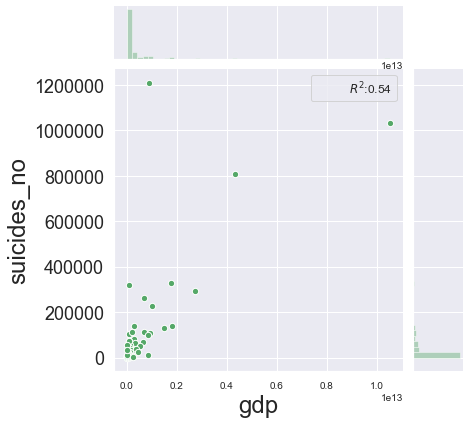

In [205]:
#The correlation between perGDP vs suicide number
sns.lmplot(x = "gdp",y = "suicides_no",
                 data = gdp_df)

g = sns.JointGrid(x = "gdp",y = "suicides_no",
                 data = gdp_df)
g = g.plot_joint(plt.scatter,
               color="g",s=40,edgecolor="white")
g=g.plot_marginals(sns.distplot, kde=False, color="g")
rsquare = lambda a,b: stats.pearsonr(a,b)[0]**2
g = g.annotate(rsquare, template="{stat}:{val:.2f}",
              stat="$R^2$",loc= "upper right", fontsize=12)

### HDI analysis

In [206]:

        #print(data2[data2.country.eq(eachcon)].population)
years = data2['year'].unique()



hdi_df = pd.DataFrame(columns=['country','HDI'])
hdi_df = hdi_df.fillna(0)


for eachcon in countries:
    #print("--------------------------")
    #print(eachcon)
    hdi_for_year = []
    for eachyear in years:
                    #print(eachyear)
                    try:
                        temphd = float(data2[data2.country.eq(eachcon) & data2.year.eq(eachyear)].HDI_for_year.iloc[0])
                        if temphd != 0:
                            hdi_for_year.append(temphd)
                    except Exception as e:
                        #print(e)
                        print("Info : HDI for",eachcon,eachyear,"not found")
    #print(gdp_for_country)
    hdi_df = hdi_df.append({'country' : eachcon , 'HDI' : np.average(hdi_for_year)} , ignore_index=True)

Info : HDI for Albania 1985 not found
Info : HDI for Albania 1986 not found
Info : HDI for Albania 1990 not found
Info : HDI for Albania 1991 not found
Info : HDI for Albania 2012 not found
Info : HDI for Albania 2013 not found
Info : HDI for Albania 2014 not found
Info : HDI for Albania 2015 not found
Info : HDI for Albania 2011 not found
Info : HDI for Albania 2016 not found
Info : HDI for Antigua and Barbuda 1996 not found
Info : HDI for Antigua and Barbuda 1997 not found
Info : HDI for Antigua and Barbuda 2010 not found
Info : HDI for Antigua and Barbuda 2011 not found
Info : HDI for Antigua and Barbuda 2016 not found
Info : HDI for Argentina 2016 not found
Info : HDI for Armenia 1987 not found
Info : HDI for Armenia 1988 not found
Info : HDI for Armenia 1989 not found
Info : HDI for Armenia 2004 not found
Info : HDI for Armenia 2005 not found
Info : HDI for Armenia 1985 not found
Info : HDI for Armenia 1986 not found
Info : HDI for Aruba 1987 not found
Info : HDI for Aruba 1988 no

Info : HDI for Cyprus 1985 not found
Info : HDI for Cyprus 1986 not found
Info : HDI for Cyprus 1990 not found
Info : HDI for Cyprus 1991 not found
Info : HDI for Czech Republic 1987 not found
Info : HDI for Czech Republic 1988 not found
Info : HDI for Czech Republic 1989 not found
Info : HDI for Czech Republic 1985 not found
Info : HDI for Czech Republic 1986 not found
Info : HDI for Denmark 1987 not found
Info : HDI for Denmark 1988 not found
Info : HDI for Denmark 1989 not found
Info : HDI for Denmark 1992 not found
Info : HDI for Denmark 1993 not found
Info : HDI for Denmark 1985 not found
Info : HDI for Denmark 1986 not found
Info : HDI for Denmark 1990 not found
Info : HDI for Denmark 1991 not found
Info : HDI for Denmark 2016 not found
Info : HDI for Dominica 1987 not found
Info : HDI for Dominica 1988 not found
Info : HDI for Dominica 1989 not found
Info : HDI for Dominica 1992 not found
Info : HDI for Dominica 1993 not found
Info : HDI for Dominica 1994 not found
Info : HDI fo

Info : HDI for Luxembourg 2016 not found
Info : HDI for Macau 1987 not found
Info : HDI for Macau 1988 not found
Info : HDI for Macau 1989 not found
Info : HDI for Macau 1992 not found
Info : HDI for Macau 1993 not found
Info : HDI for Macau 1995 not found
Info : HDI for Macau 1996 not found
Info : HDI for Macau 1997 not found
Info : HDI for Macau 1998 not found
Info : HDI for Macau 1999 not found
Info : HDI for Macau 2000 not found
Info : HDI for Macau 2001 not found
Info : HDI for Macau 2002 not found
Info : HDI for Macau 2003 not found
Info : HDI for Macau 2004 not found
Info : HDI for Macau 2005 not found
Info : HDI for Macau 2006 not found
Info : HDI for Macau 2007 not found
Info : HDI for Macau 2008 not found
Info : HDI for Macau 2009 not found
Info : HDI for Macau 2010 not found
Info : HDI for Macau 1985 not found
Info : HDI for Macau 1986 not found
Info : HDI for Macau 1990 not found
Info : HDI for Macau 1991 not found
Info : HDI for Macau 2012 not found
Info : HDI for Macau 20

Info : HDI for Qatar 1991 not found
Info : HDI for Republic of Korea 2016 not found
Info : HDI for Romania 1987 not found
Info : HDI for Romania 1988 not found
Info : HDI for Romania 1985 not found
Info : HDI for Romania 1986 not found
Info : HDI for Russian Federation 1987 not found
Info : HDI for Russian Federation 1988 not found
Info : HDI for Russian Federation 1985 not found
Info : HDI for Russian Federation 1986 not found
Info : HDI for Russian Federation 2016 not found
Info : HDI for Saint Kitts and Nevis 1987 not found
Info : HDI for Saint Kitts and Nevis 1988 not found
Info : HDI for Saint Kitts and Nevis 1989 not found
Info : HDI for Saint Kitts and Nevis 1993 not found
Info : HDI for Saint Kitts and Nevis 1994 not found
Info : HDI for Saint Kitts and Nevis 1995 not found
Info : HDI for Saint Kitts and Nevis 1996 not found
Info : HDI for Saint Kitts and Nevis 1997 not found
Info : HDI for Saint Kitts and Nevis 1998 not found
Info : HDI for Saint Kitts and Nevis 1999 not found

Info : HDI for Turkey 2006 not found
Info : HDI for Turkey 2007 not found
Info : HDI for Turkey 2008 not found
Info : HDI for Turkey 1985 not found
Info : HDI for Turkey 1986 not found
Info : HDI for Turkey 1990 not found
Info : HDI for Turkey 1991 not found
Info : HDI for Turkey 2016 not found
Info : HDI for Turkmenistan 1985 not found
Info : HDI for Turkmenistan 1986 not found
Info : HDI for Turkmenistan 2016 not found
Info : HDI for Ukraine 1985 not found
Info : HDI for Ukraine 1986 not found
Info : HDI for Ukraine 2013 not found
Info : HDI for Ukraine 2016 not found
Info : HDI for United Arab Emirates 1987 not found
Info : HDI for United Arab Emirates 1988 not found
Info : HDI for United Arab Emirates 1989 not found
Info : HDI for United Arab Emirates 1992 not found
Info : HDI for United Arab Emirates 1993 not found
Info : HDI for United Arab Emirates 1994 not found
Info : HDI for United Arab Emirates 1995 not found
Info : HDI for United Arab Emirates 1996 not found
Info : HDI for 

In [207]:
#print(list(data2.groupby(['country']).suicides_100k_pop.sum().to_frame().suicides_100k_pop))
hdi_df['suicides_100k_pop'] = list(data2.groupby(['country']).suicides_100k_pop.sum().to_frame().suicides_100k_pop)

In [208]:
hdi_df.head()

,country,HDI,suicides_100k_pop
0,Albania,0.673000,924.76
1,Antigua and Barbuda,0.781667,179.14
2,Argentina,0.779600,3894.59
3,Armenia,0.690125,976.21
4,Aruba,NaN,1596.52


In [209]:


#Draw a choropleth map of world to show the HDI by country
plotly.offline.init_notebook_mode()

colorscale = [[0,"#f7fbff"], 
              [0.1,"#ebf3fb"], 
              [0.2,"#deebf7"], 
              [0.3,"#d2e3f3"], 
              [0.4,"#c6dbef"], 
              [0.45,"#b3d2e9"], 
              [0.5,"#9ecae1"],
              [0.55,"#85bcdb"],
              [0.6,"#6baed6"], 
              [0.65,"#57a0ce"], 
              [0.7,"#4292c6"],
              [0.75,"#3082be"],
              [0.8,"#2171b5"],
              [0.85,"#1361a9"],
              [0.9,"#08519c"],
              [0.95,"#0b4083"],
              [1.0,"#08306b"]]


#data to graph
my_data01 = [dict(type='choropleth', 
        colorscale=colorscale,
        locations=hdi_df['country'],
        z=hdi_df['HDI'],
        locationmode='country names',
        text=gdp_df['country'],
        hoverinfo='location+z',
        marker=dict(line=dict(color='rgb(180,180,180)',width=0.5)),
        colorbar=dict(title='HDI'))]

#layout
my_layout01 = dict(title='HDI',
                 geo=dict(scope='world',
                          projection=dict(type='mercator'),
                          showcoastlines= False,
                          showframe= False))

fig = dict(data=my_data01, layout=my_layout01)
py.iplot(fig, validata=False, filename='HDI')



In [210]:
hdi_df2 = hdi_df.dropna()
len(hdi_df2)

90

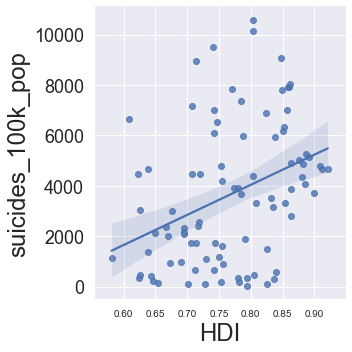

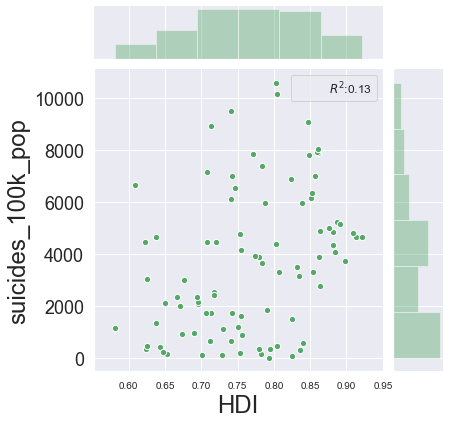

In [211]:
#The correlation between HDI vs suicide number
sns.lmplot(x = "HDI",y = "suicides_100k_pop",
                 data = hdi_df2)

g = sns.JointGrid(x = "HDI",y = "suicides_100k_pop",
                 data = hdi_df2)
g = g.plot_joint(plt.scatter,
               color="g",s=40,edgecolor="white")
g=g.plot_marginals(sns.distplot, kde=False, color="g")
rsquare = lambda a,b: stats.pearsonr(a,b)[0]**2
g = g.annotate(rsquare, template="{stat}:{val:.2f}",
              stat="$R^2$",loc= "upper right", fontsize=12)

### GDI, HDI, Suicides

In [212]:
gdp_n_HDI = gdp_df

#print(list(data2.groupby(['country']).suicides_100k_pop.sum().to_frame().suicides_100k_pop))
gdp_n_HDI['HDI'] = hdi_df['HDI']
gdp_n_HDI.head()

,country,gdp,gdp_per_capita,suicides_100k_pop,suicides_no,HDI
0,Albania,5.211661e+09,1859.045455,924.76,1970,0.673000
1,Antigua and Barbuda,8.035452e+08,10448.185185,179.14,11,0.781667
2,Argentina,2.742565e+11,7914.096774,3894.59,82219,0.779600
3,Armenia,5.420989e+09,1886.680000,976.21,1905,0.690125
4,Aruba,2.196223e+09,24221.642857,1596.52,101,NaN


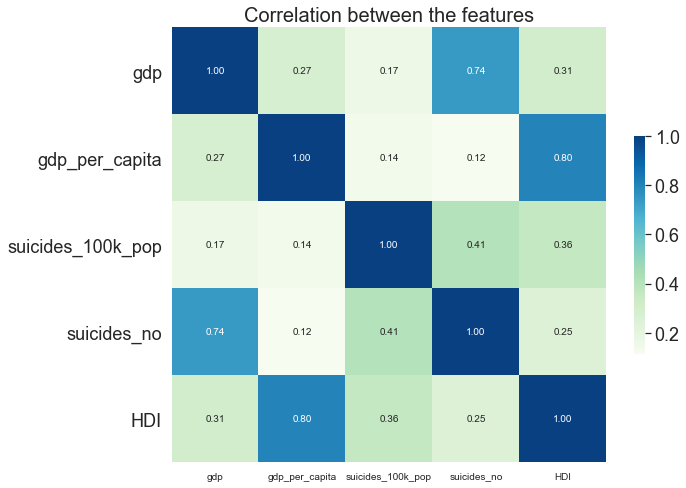

In [213]:
#Correlation between 4 variables
correlation= gdp_n_HDI.corr()
plt.figure(figsize=(10,8))
ax = sns.heatmap(correlation, vmax=1, square=True, annot=True,fmt='.2f', 
                 cmap ='GnBu', cbar_kws={"shrink": .5}, robust=True)
plt.title('Correlation between the features', fontsize=20)
plt.show()
plt.clf()
plt.cla()
plt.close()


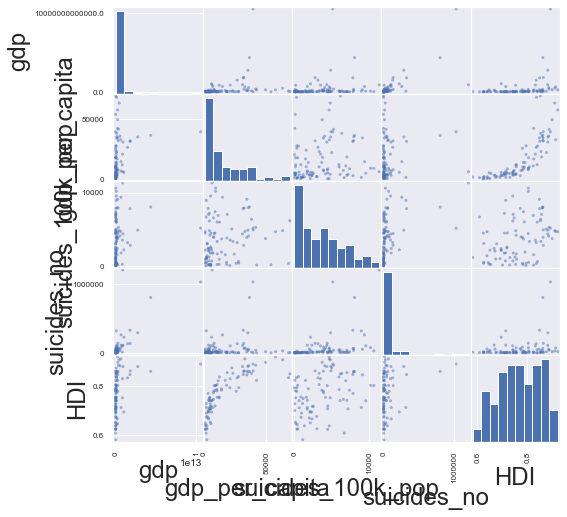

In [214]:


#Correlation between 4 variables
pd.plotting.scatter_matrix(gdp_n_HDI, figsize=(8, 8))
plt.show()
plt.clf()
plt.cla()
plt.close()


### More visualizations

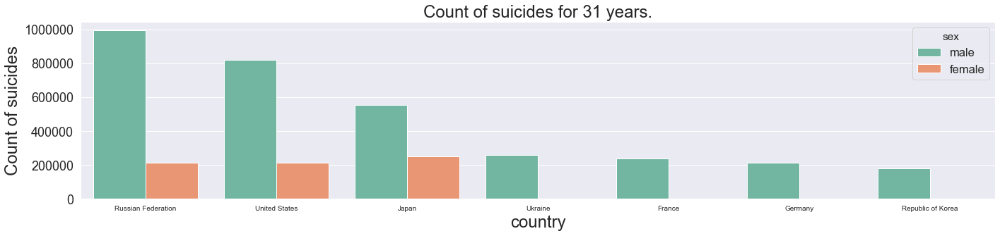

In [215]:


suic_sum_m = data2['suicides_no'].groupby([data2['country'],data2['sex']]).sum()
suic_sum_m = suic_sum_m.reset_index().sort_index(by='suicides_no',ascending=False)
most_cont_m = suic_sum_m.head(10)
most_cont_m.head(10)
fig = plt.figure(figsize=(20,5))
plt.title('Count of suicides for 31 years.')
sns.set(font_scale=1.5)
sns.barplot(y='suicides_no',x='country',hue='sex',data=most_cont_m,palette='Set2');
plt.ylabel('Count of suicides')
plt.tight_layout()



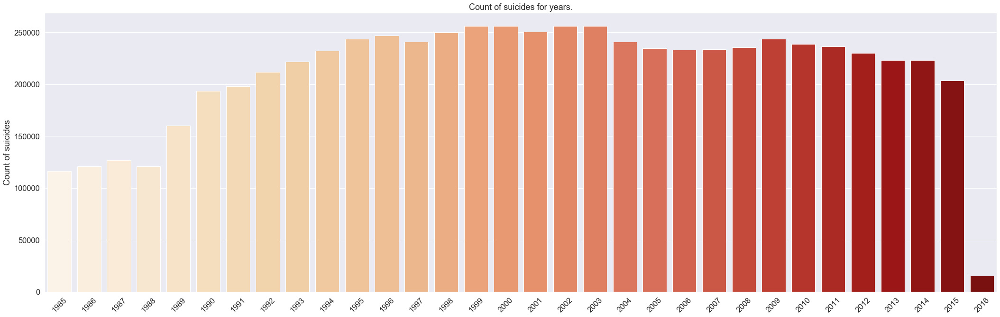

In [216]:


suic_sum_yr = pd.DataFrame(data2['suicides_no'].groupby(data2['year']).sum())
suic_sum_yr = suic_sum_yr.reset_index().sort_index(by='suicides_no',ascending=False)
most_cont_yr = suic_sum_yr
fig = plt.figure(figsize=(30,10))
plt.title('Count of suicides for years.')
sns.set(font_scale=2.5)
sns.barplot(y='suicides_no',x='year',data=most_cont_yr,palette="OrRd");
plt.ylabel('Count of suicides')
plt.xlabel('')
plt.xticks(rotation=45)
plt.tight_layout()



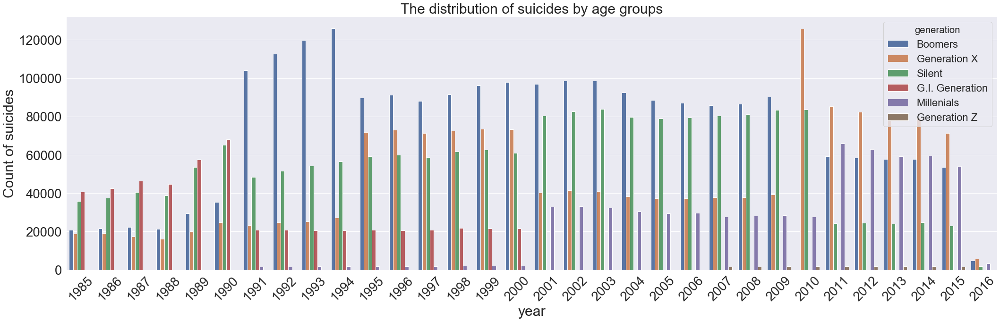

In [217]:


suic_sum_yr = pd.DataFrame(data2['suicides_no'].groupby([data2['generation'],data2['year']]).sum())
suic_sum_yr = suic_sum_yr.reset_index().sort_index(by='suicides_no',ascending=False)
most_cont_yr = suic_sum_yr
fig = plt.figure(figsize=(30,10))
plt.title('The distribution of suicides by age groups')

sns.set(font_scale=2)
sns.barplot(y='suicides_no',x='year',hue='generation',data=most_cont_yr,palette='deep');
plt.ylabel('Count of suicides')
plt.xticks(rotation=45)
plt.tight_layout()


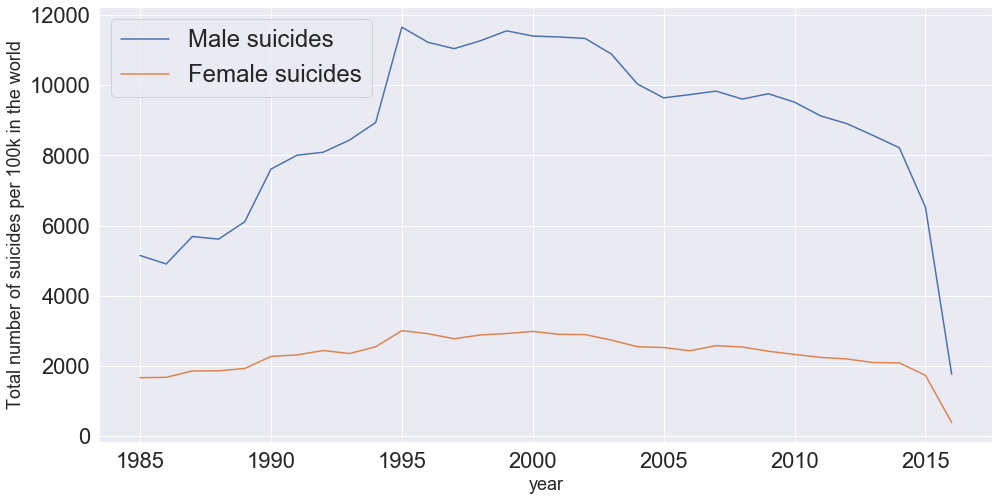

In [218]:
year = data2.groupby('year').year.unique()

malesuicides = pd.DataFrame(data2[data2.sex == 'male'].groupby('year').suicides_100k_pop.sum())
femalesuicides = pd.DataFrame(data2[data2.sex == 'female'].groupby('year').suicides_100k_pop.sum())
plt.figure(figsize=(16,8))
plt.plot(year.index, malesuicides,label="Male suicides")
plt.plot(year.index, femalesuicides,label="Female suicides")
plt.xlabel('year', fontsize=18)
plt.ylabel('Total number of suicides per 100k in the world', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()
#print(data2[data2.sex == 'male'].groupby('year').suicides_100k_pop.sum())


['15-24 years' '35-54 years' '75+ years' '25-34 years' '55-74 years'
 '5-14 years']


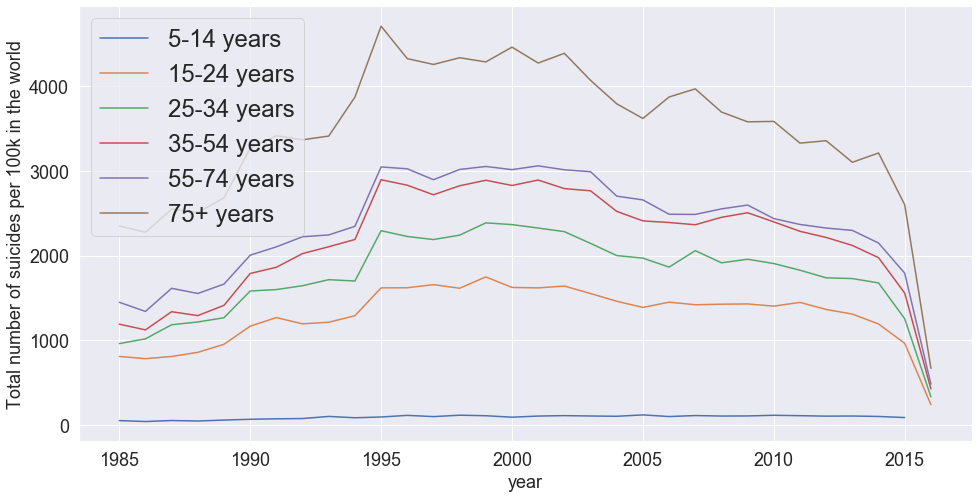

In [219]:
agegroups = data2.age.unique()
print(agegroups)

agegone_suicides = pd.DataFrame(data2[data2.age == '5-14 years'].groupby('year').suicides_100k_pop.sum())
agegtwo_suicides = pd.DataFrame(data2[data2.age == '15-24 years'].groupby('year').suicides_100k_pop.sum())
agegthr_suicides = pd.DataFrame(data2[data2.age == '25-34 years'].groupby('year').suicides_100k_pop.sum())
agegfou_suicides = pd.DataFrame(data2[data2.age == '35-54 years'].groupby('year').suicides_100k_pop.sum())
agegfiv_suicides = pd.DataFrame(data2[data2.age == '55-74 years'].groupby('year').suicides_100k_pop.sum())
agegsix_suicides = pd.DataFrame(data2[data2.age == '75+ years'].groupby('year').suicides_100k_pop.sum())

#print(agegone_suicides.suicides_100k_pop.columns)
#print(year.index)
plt.figure(figsize=(16,8))
plt.plot( agegone_suicides,label='5-14 years')
plt.plot(agegtwo_suicides,label='15-24 years')
plt.plot(year.index, agegthr_suicides,label='25-34 years')
plt.plot(year.index, agegfou_suicides,label='35-54 years')
plt.plot(year.index, agegfiv_suicides,label='55-74 years')
plt.plot(year.index, agegsix_suicides,label='75+ years')
plt.xlabel('year', fontsize=18)
plt.ylabel('Total number of suicides per 100k in the world', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()
#print(data2[data2.sex == 'male'].groupby('year').suicides_100k_pop.sum())

#### Key insights
    
    Suicide rates are decreasing globally. (2.1)
    Of those countries that show clear linear trends over time, 2/3 are decreasing. (2.5.2)
    On average, suicide rate increases with age. (2.4)
    This remains true when controlling for continent in the Americas, Asia & Europe, but not for Africa & Oceania. (2.8)
    There is a weak positive relationship between a countries GDP (per capita) and suicide rate. (2.10)
    The highest suicide rate ever recorded in a demographic (for 1 year) is 225 (per 100k population). (2.12)
    There is an overrepresentation of men in suicide deaths at every level of analysis (globally, at a continent and country level). Globally, the male rate is ~3.5x higher. (2.3) (2.6) (2.7)

When GDP is low, it seems that there will be more suicides per 100,000 people.


### Regression analysis

In [220]:
import seaborn as seabornInstance 
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
%matplotlib inline

In [221]:
gdp_n_HDI = gdp_n_HDI.dropna()
len(gdp_n_HDI)

90

In [222]:
regressor = LinearRegression()  
regressor.fit(gdp_n_HDI[['gdp','gdp_per_capita','HDI']], gdp_n_HDI[['suicides_100k_pop']])


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

#### sucides vs gdp, gdp_per_Capita, hdi

In [223]:
import statsmodels.api as sm

X =gdp_n_HDI[['gdp','gdp_per_capita','HDI']] ## X usually means our input variables (or independent variables)

X = sm.add_constant(X)
# Note the difference in argument order
model = sm.OLS(gdp_n_HDI[['suicides_100k_pop']],X).fit()
#predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      suicides_100k_pop   R-squared:                       0.173
Model:                            OLS   Adj. R-squared:                  0.144
Method:                 Least Squares   F-statistic:                     6.007
Date:                Sat, 23 May 2020   Prob (F-statistic):           0.000915
Time:                        14:08:50   Log-Likelihood:                -832.18
No. Observations:                  90   AIC:                             1672.
Df Residuals:                      86   BIC:                             1682.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1.113e+04   3837.373     -2.901      0.005   -1.88e+04   -3504.281
gdp             1.018e-10    2.3e-10      0.443      0.659   -3.56e-10    5.59e-10
gdp_per_capita    -0.0568      0.028     -2.059      0.042      -0.112      -0.002
HDI             2.041e+04   5443.757      3.749      0.000    9587.785    3.12e+04
==============================================================================
Omnibus:                        5.810   Durbin-Watson:                   1.706
Prob(Omnibus):                  0.055   Jarque-Bera (JB):                5.882
Skew:                           0.594   Prob(JB):                       0.0528
Kurtosis:                       2.604   Cond. No.                     3.19e+13
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.19e+13. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### sucides vs hdi

In [224]:
import statsmodels.api as sm

# Note the difference in argument order

X =gdp_n_HDI[['HDI']] ## X usually means our input variables (or independent variables)

X = sm.add_constant(X)


model = sm.OLS(gdp_n_HDI[['suicides_100k_pop']],X).fit()
#predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      suicides_100k_pop   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.122
Method:                 Least Squares   F-statistic:                     13.34
Date:                Sat, 23 May 2020   Prob (F-statistic):           0.000440
Time:                        14:08:51   Log-Likelihood:                -834.39
No. Observations:                  90   AIC:                             1673.
Df Residuals:                      88   BIC:                             1678.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -5512.8565   2524.721     -2.184      0.032   -1.05e+04    -495.503
HDI         1.194e+04   3269.178      3.653      0.000    5445.471    1.84e+04
==============================================================================
Omnibus:                        5.782   Durbin-Watson:                   1.809
Prob(Omnibus):                  0.056   Jarque-Bera (JB):                5.900
Skew:                           0.618   Prob(JB):                       0.0524
Kurtosis:                       2.785   Cond. No.                         19.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

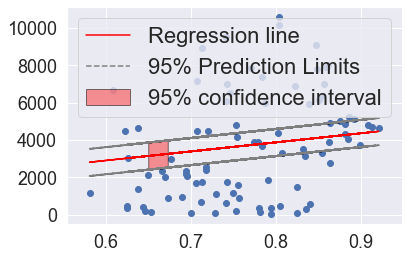

In [225]:
plt.scatter(gdp_n_HDI.HDI, gdp_n_HDI[['suicides_100k_pop']])
beta = 4846.0429
alpha = 0
st_err =  362.311
#plt.xlabel('Number of friends')
#plt.ylabel('Average minutes per day on site')
plt.plot(gdp_n_HDI.HDI,  alpha+ np.array(gdp_n_HDI.HDI)*beta, '-',color="red",label="Regression line")
y1 = alpha+ np.array(gdp_n_HDI.HDI)*beta - 2*st_err
y2 = alpha+ np.array(gdp_n_HDI.HDI)*beta + 2*st_err
plt.fill_between(gdp_n_HDI.HDI, y1, y2, facecolor=(1,0,0,.4), edgecolor=(0,0,0,.5), label="95% confidence interval")
plt.plot(gdp_n_HDI.HDI,y1 , "--", color="0.5", label="95% Prediction Limits")
plt.plot(gdp_n_HDI.HDI,y2, "--", color="0.5")
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

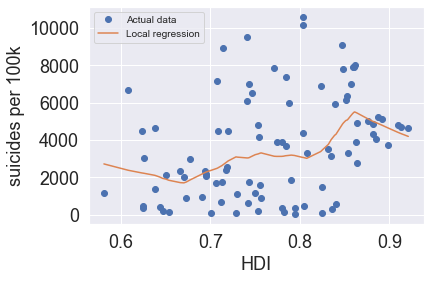

In [226]:
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
import statsmodels.api as sm

# introduce some floats in our x-values

X =gdp_n_HDI.HDI
Y= gdp_n_HDI.suicides_100k_pop
# lowess will return our "smoothed" data with a y value for at every x-value
lowess = sm.nonparametric.lowess(Y, X, frac=.3)

# unpack the lowess smoothed points to their values
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

# run scipy's interpolation. There is also extrapolation I believe
f = interp1d(lowess_x, lowess_y, bounds_error=False)

xnew = [i/10. for i in range(400)]

# this this generate y values for our xvalues by our interpolator
# it will MISS values outsite of the x window (less than 3, greater than 33)
# There might be a better approach, but you can run a for loop
#and if the value is out of the range, use f(min(lowess_x)) or f(max(lowess_x))
ynew = f(xnew)


plt.plot(X, Y, 'o',label="Actual data")
plt.plot(lowess_x, lowess_y, '-',label="Local regression")
#plt.plot(xnew, ynew, '-')
plt.xlabel('HDI', fontsize=18)
plt.ylabel('suicides per 100k', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()



In [227]:
gdp_n_HDI.head()

,country,gdp,gdp_per_capita,suicides_100k_pop,suicides_no,HDI
0,Albania,5.211661e+09,1859.045455,924.76,1970,0.673000
1,Antigua and Barbuda,8.035452e+08,10448.185185,179.14,11,0.781667
2,Argentina,2.742565e+11,7914.096774,3894.59,82219,0.779600
3,Armenia,5.420989e+09,1886.680000,976.21,1905,0.690125
5,Australia,6.327501e+11,32776.400000,4677.41,70111,0.912750


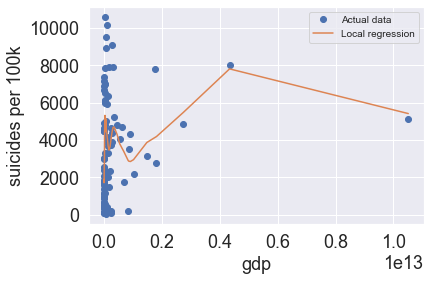

In [228]:
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
import statsmodels.api as sm

# introduce some floats in our x-values

X =gdp_n_HDI.gdp
Y= gdp_n_HDI.suicides_100k_pop
# lowess will return our "smoothed" data with a y value for at every x-value
lowess = sm.nonparametric.lowess(Y, X, frac=.3)

# unpack the lowess smoothed points to their values
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

# run scipy's interpolation. There is also extrapolation I believe
f = interp1d(lowess_x, lowess_y, bounds_error=False)

xnew = [i/10. for i in range(400)]

# this this generate y values for our xvalues by our interpolator
# it will MISS values outsite of the x window (less than 3, greater than 33)
# There might be a better approach, but you can run a for loop
#and if the value is out of the range, use f(min(lowess_x)) or f(max(lowess_x))
ynew = f(xnew)


plt.plot(X, Y, 'o',label="Actual data")
plt.plot(lowess_x, lowess_y, '-',label="Local regression")
#plt.plot(xnew, ynew, '-')
plt.xlabel('gdp', fontsize=18)
plt.ylabel('suicides per 100k', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()



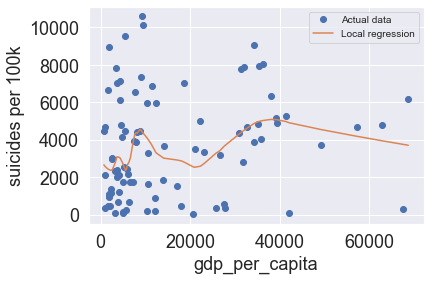

In [229]:
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
import statsmodels.api as sm

# introduce some floats in our x-values

X =gdp_n_HDI.gdp_per_capita
Y= gdp_n_HDI.suicides_100k_pop
# lowess will return our "smoothed" data with a y value for at every x-value
lowess = sm.nonparametric.lowess(Y, X, frac=.3)

# unpack the lowess smoothed points to their values
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

# run scipy's interpolation. There is also extrapolation I believe
f = interp1d(lowess_x, lowess_y, bounds_error=False)

xnew = [i/10. for i in range(400)]

# this this generate y values for our xvalues by our interpolator
# it will MISS values outsite of the x window (less than 3, greater than 33)
# There might be a better approach, but you can run a for loop
#and if the value is out of the range, use f(min(lowess_x)) or f(max(lowess_x))
ynew = f(xnew)


plt.plot(X, Y, 'o',label="Actual data")
plt.plot(lowess_x, lowess_y, '-',label="Local regression")
#plt.plot(xnew, ynew, '-')
plt.xlabel('gdp_per_capita', fontsize=18)
plt.ylabel('suicides per 100k', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()



##### Linear Regression on all variables without HDI

In [230]:
data3 = data2.drop(['country','country-year','generation','suicides_no'], axis = 1) 
data3 = data3.drop(['HDI_for_year'], axis = 1) 
#data3 = data3.drop(['generation'], axis = 1) 

In [231]:
data3.head()

,year,sex,age,population,suicides_100k_pop,gdp_for_year,gdp_per_capita
0,1987,male,15-24 years,312900,6.71,2156624900,796
1,1987,male,35-54 years,308000,5.19,2156624900,796
2,1987,female,15-24 years,289700,4.83,2156624900,796
3,1987,male,75+ years,21800,4.59,2156624900,796
4,1987,male,25-34 years,274300,3.28,2156624900,796


In [232]:
#Converting sex into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)
data3.head()

,year,age,population,suicides_100k_pop,gdp_for_year,gdp_per_capita,sex_male
0,1987,15-24 years,312900,6.71,2156624900,796,1
1,1987,35-54 years,308000,5.19,2156624900,796,1
2,1987,15-24 years,289700,4.83,2156624900,796,0
3,1987,75+ years,21800,4.59,2156624900,796,1
4,1987,25-34 years,274300,3.28,2156624900,796,1


In [233]:
#Converting age into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
data3.head()

,year,population,suicides_100k_pop,gdp_for_year,gdp_per_capita,sex_male,age_25-34 years,age_35-54 years,age_5-14 years,age_55-74 years,age_75+ years
0,1987,312900,6.71,2156624900,796,1,0,0,0,0,0
1,1987,308000,5.19,2156624900,796,1,0,1,0,0,0
2,1987,289700,4.83,2156624900,796,0,0,0,0,0,0
3,1987,21800,4.59,2156624900,796,1,0,0,0,0,1
4,1987,274300,3.28,2156624900,796,1,1,0,0,0,0


In [234]:
#Converting age into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['year'], prefix='year',drop_first=True)],axis=1).drop(['year'],axis=1)
data3.head()

,population,suicides_100k_pop,gdp_for_year,gdp_per_capita,sex_male,age_25-34 years,age_35-54 years,age_5-14 years,age_55-74 years,age_75+ years,...,year_2007,year_2008,year_2009,year_2010,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016
0,312900,6.71,2156624900,796,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,308000,5.19,2156624900,796,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,289700,4.83,2156624900,796,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,21800,4.59,2156624900,796,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,274300,3.28,2156624900,796,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [235]:
import statsmodels.api as sm
#data3 = data3.drop(['gdp_for_year'], axis = 1)
X =data3.drop(['suicides_100k_pop'], axis = 1)   	 ## X usually means our input variables (or independent variables)

X = sm.add_constant(X)
# Note the difference in argument order
model = sm.OLS(data3.suicides_100k_pop,X).fit()
#predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      suicides_100k_pop   R-squared:                       0.301
Model:                            OLS   Adj. R-squared:                  0.300
Method:                 Least Squares   F-statistic:                     299.3
Date:                Sat, 23 May 2020   Prob (F-statistic):               0.00
Time:                        14:08:54   Log-Likelihood:            -1.1635e+05
No. Observations:               27820   AIC:                         2.328e+05
Df Residuals:                   27779   BIC:                         2.331e+05
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0725      0.704      0.103      0.918      -1.307       1.452
population       2.017e-07   3.67e-08      5.502      0.000     1.3e-07    2.74e-07
gdp_for_year    -5.961e-14   1.01e-13     -0.588      0.556   -2.58e-13    1.39e-13
gdp_per_capita   2.025e-05   5.74e-06      3.528      0.000       9e-06    3.15e-05
sex_male           14.8642      0.190     78.136      0.000      14.491      15.237
age_25-34 years     3.2486      0.329      9.866      0.000       2.603       3.894
age_35-54 years     5.7511      0.332     17.304      0.000       5.100       6.403
age_5-14 years     -8.3302      0.330    -25.247      0.000      -8.977      -7.684
age_55-74 years     7.2014      0.329     21.871      0.000       6.556       7.847
age_75+ years      15.2680      0.333     45.900      0.000      14.616      15.920
year_1986          -0.4291      0.935     -0.459      0.646      -2.261       1.403
year_1987          -0.2199      0.908     -0.242      0.809      -2.001       1.561
year_1988           0.8022      0.930      0.862      0.388      -1.021       2.625
year_1989           0.9431      0.917      1.029      0.304      -0.854       2.740
year_1990           0.9364      0.875      1.071      0.284      -0.778       2.651
year_1991           1.5008      0.875      1.716      0.086      -0.213       3.215
year_1992           1.5393      0.872      1.766      0.077      -0.169       3.248
year_1993           1.8838      0.872      2.161      0.031       0.175       3.592
year_1994           2.1167      0.864      2.450      0.014       0.423       3.810
year_1995           3.7224      0.840      4.429      0.000       2.075       5.370
year_1996           3.3487      0.843      3.973      0.000       1.697       5.001
year_1997           2.9931      0.843      3.552      0.000       1.341       4.645
year_1998           2.9738      0.838      3.547      0.000       1.331       4.617
year_1999           2.5749      0.831      3.097      0.002       0.945       4.204
year_2000           1.9973      0.826      2.419      0.016       0.379       3.616
year_2001           1.5993      0.822      1.945      0.052      -0.013       3.211
year_2002           1.8356      0.826      2.223      0.026       0.217       3.454
year_2003           1.2104      0.826      1.465      0.143      -0.409       2.830
year_2004           0.4376      0.832      0.526      0.599      -1.192       2.068
year_2005          -0.0208      0.833     -0.025      0.980      -1.654       1.612
year_2006          -0.1959      0.831     -0.236      0.814      -1.825       1.433
year_2007          -0.1527      0.831     -0.184      0.854      -1.781       1.476
year_2008          -0.3192      0.834     -0.383      0.702      -1.955       1.316
year_2009          -0.7597      0.824     -0.922      0.357

#### Linear Regression without year, HDI

In [236]:
data3 = data2.drop(['country','country-year','generation','suicides_no','year'], axis = 1) 
data3 = data3.drop(['HDI_for_year'], axis = 1) 
#data3 = data3.drop(['generation'], axis = 1) 

#Converting sex into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)
data3.head()

#Converting age into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
data3.head()


import statsmodels.api as sm
#data3 = data3.drop(['gdp_for_year'], axis = 1)
X =data3.drop(['suicides_100k_pop'], axis = 1)   	 ## X usually means our input variables (or independent variables)

X = sm.add_constant(X)
# Note the difference in argument order
model = sm.OLS(data3.suicides_100k_pop,X).fit()
#predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      suicides_100k_pop   R-squared:                       0.295
Model:                            OLS   Adj. R-squared:                  0.295
Method:                 Least Squares   F-statistic:                     1295.
Date:                Sat, 23 May 2020   Prob (F-statistic):               0.00
Time:                        14:08:54   Log-Likelihood:            -1.1646e+05
No. Observations:               27820   AIC:                         2.329e+05
Df Residuals:                   27810   BIC:                         2.330e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               1.1692      0.272      4.295      0.000       0.636       1.703
population       2.056e-07   3.68e-08      5.592      0.000    1.34e-07    2.78e-07
gdp_for_year    -5.984e-14   1.02e-13     -0.588      0.556   -2.59e-13    1.39e-13
gdp_per_capita  -6.276e-07   5.42e-06     -0.116      0.908   -1.13e-05       1e-05
sex_male           14.8645      0.191     77.857      0.000      14.490      15.239
age_25-34 years     3.2488      0.330      9.831      0.000       2.601       3.897
age_35-54 years     5.7463      0.334     17.227      0.000       5.093       6.400
age_5-14 years     -8.3188      0.331    -25.130      0.000      -8.968      -7.670
age_55-74 years     7.2013      0.330     21.792      0.000       6.554       7.849
age_75+ years      15.2731      0.334     45.752      0.000      14.619      15.927
==============================================================================
Omnibus:                    16248.055   Durbin-Watson:                   0.933
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           225742.694
Skew:                           2.555   Prob(JB):                         0.00
Kurtosis:                      15.986   Cond. No.                     9.78e+12
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.78e+12. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Linear Regression with all variables

In [237]:
data3 = data2.drop(['country','country-year','generation','suicides_no'], axis = 1) 
#data3 = data3.drop(['HDI_for_year'], axis = 1) 
#data3 = data3.drop(['generation'], axis = 1) 

#Converting sex into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)
data3.head()

#Converting age into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
data3.head()


data3 = pd.concat([data3,pd.get_dummies(data3['year'], prefix='year',drop_first=True)],axis=1).drop(['year'],axis=1)
data3.head()

data3 = data3.dropna()  #Remove empty HDI

import statsmodels.api as sm
#data3 = data3.drop(['gdp_for_year'], axis = 1)
X =data3.drop(['suicides_100k_pop'], axis = 1)   	 ## X usually means our input variables (or independent variables)

X = sm.add_constant(X)
# Note the difference in argument order
model = sm.OLS(data3.suicides_100k_pop,X).fit()
#predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      suicides_100k_pop   R-squared:                       0.301
Model:                            OLS   Adj. R-squared:                  0.300
Method:                 Least Squares   F-statistic:                     292.0
Date:                Sat, 23 May 2020   Prob (F-statistic):               0.00
Time:                        14:08:55   Log-Likelihood:            -1.1635e+05
No. Observations:               27820   AIC:                         2.328e+05
Df Residuals:                   27778   BIC:                         2.331e+05
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0756      0.802     -0.094      0.925      -1.648       1.497
population       2.021e-07   3.67e-08      5.511      0.000     1.3e-07    2.74e-07
HDI_for_year        0.2782      0.724      0.384      0.701      -1.141       1.697
gdp_for_year    -6.111e-14   1.01e-13     -0.603      0.547    -2.6e-13    1.38e-13
gdp_per_capita   1.985e-05   5.85e-06      3.395      0.001    8.39e-06    3.13e-05
sex_male           14.8642      0.190     78.135      0.000      14.491      15.237
age_25-34 years     3.2487      0.329      9.866      0.000       2.603       3.894
age_35-54 years     5.7505      0.332     17.302      0.000       5.099       6.402
age_5-14 years     -8.3302      0.330    -25.247      0.000      -8.977      -7.683
age_55-74 years     7.2015      0.329     21.871      0.000       6.556       7.847
age_75+ years      15.2685      0.333     45.902      0.000      14.617      15.921
year_1986          -0.2601      1.013     -0.257      0.797      -2.246       1.726
year_1987          -0.0572      0.990     -0.058      0.954      -1.998       1.884
year_1988           0.9389      1.010      0.930      0.353      -1.041       2.919
year_1989           1.1024      0.998      1.104      0.269      -0.854       3.059
year_1990           0.9341      0.875      1.068      0.286      -0.780       2.648
year_1991           1.6532      0.960      1.723      0.085      -0.228       3.534
year_1992           1.6928      0.957      1.769      0.077      -0.183       3.569
year_1993           2.0374      0.957      2.128      0.033       0.161       3.914
year_1994           2.2641      0.950      2.382      0.017       0.401       4.127
year_1995           3.7153      0.841      4.416      0.000       2.066       5.364
year_1996           3.5012      0.931      3.759      0.000       1.675       5.327
year_1997           3.1456      0.931      3.378      0.001       1.320       4.971
year_1998           3.1252      0.928      3.366      0.001       1.306       4.945
year_1999           2.7246      0.922      2.955      0.003       0.918       4.532
year_2000           1.9619      0.830      2.364      0.018       0.335       3.589
year_2001           1.7469      0.913      1.913      0.056      -0.043       3.537
year_2002           1.9920      0.917      2.173      0.030       0.196       3.789
year_2003           1.3678      0.918      1.490      0.136      -0.432       3.167
year_2004           0.5983      0.923      0.648      0.517      -1.211       2.408
year_2005          -0.0684      0.838     -0.082      0.935      -1.711       1.575
year_2006          -0.0382      0.926     -0.041      0.967      -1.854       1.777
year_2007           0.0089      0.927      0.010      0.992      -1.808       1.826
year_2008          -0.1620      0.931     -0.174      0.862

#### Linear Regression without year

In [238]:
data3 = data2.drop(['country','country-year','generation','suicides_no','year'], axis = 1) 
#data3 = data3.drop(['HDI_for_year'], axis = 1) 
#data3 = data3.drop(['generation'], axis = 1) 

#Converting sex into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)
data3.head()

#Converting age into onehot encoding

data3 = pd.concat([data3,pd.get_dummies(data3['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
data3.head()




data3 = data3.dropna()  #Remove empty HDI

import statsmodels.api as sm
#data3 = data3.drop(['gdp_for_year'], axis = 1)
X =data3.drop(['suicides_100k_pop'], axis = 1)   	 ## X usually means our input variables (or independent variables)

X = sm.add_constant(X)
# Note the difference in argument order
model = sm.OLS(data3.suicides_100k_pop,X).fit()
#predictions = model.predict(X) # make the predictions by the model

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      suicides_100k_pop   R-squared:                       0.296
Model:                            OLS   Adj. R-squared:                  0.296
Method:                 Least Squares   F-statistic:                     1168.
Date:                Sat, 23 May 2020   Prob (F-statistic):               0.00
Time:                        14:08:55   Log-Likelihood:            -1.1645e+05
No. Observations:               27820   AIC:                         2.329e+05
Df Residuals:                   27809   BIC:                         2.330e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               1.3770      0.276      4.990      0.000       0.836       1.918
population       2.019e-07   3.68e-08      5.491      0.000     1.3e-07    2.74e-07
HDI_for_year       -1.2364      0.272     -4.550      0.000      -1.769      -0.704
gdp_for_year    -4.958e-14   1.02e-13     -0.488      0.626   -2.49e-13     1.5e-13
gdp_per_capita   4.295e-06   5.53e-06      0.777      0.437   -6.54e-06    1.51e-05
sex_male           14.8642      0.191     77.882      0.000      14.490      15.238
age_25-34 years     3.2486      0.330      9.834      0.000       2.601       3.896
age_35-54 years     5.7509      0.333     17.247      0.000       5.097       6.404
age_5-14 years     -8.3167      0.331    -25.133      0.000      -8.965      -7.668
age_55-74 years     7.2015      0.330     21.800      0.000       6.554       7.849
age_75+ years      15.2684      0.334     45.753      0.000      14.614      15.922
==============================================================================
Omnibus:                    16232.726   Durbin-Watson:                   0.934
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           225080.455
Skew:                           2.553   Prob(JB):                         0.00
Kurtosis:                      15.966   Cond. No.                     9.79e+12
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.79e+12. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Classification

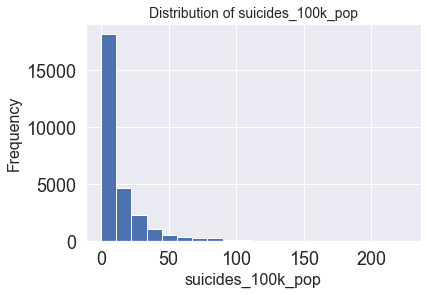

In [239]:
plt.hist(data2.suicides_100k_pop,bins=20)
plt.title("Distribution of suicides_100k_pop", fontsize=14)
plt.xlabel('suicides_100k_pop', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
#plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)
plt.show()
plt.clf()
plt.cla()
plt.close()

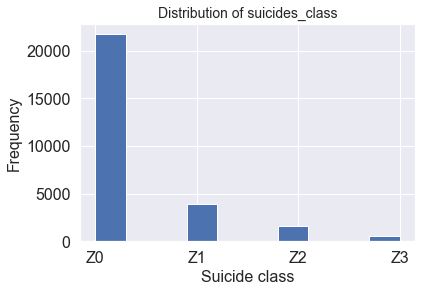

In [240]:
# > 80 Z3
#  40 - 79 Z2
#  20 - 39 Z1
# 0 - 19 Z0
data4 = data2
data4['suicides_class'] = pd.cut(x=data2['suicides_100k_pop'], bins=[-0.1,19, 39, 79, 500], labels=['Z0', 'Z1', 'Z2','Z3'])

plt.hist(data4['suicides_class'])
plt.title("Distribution of suicides_class", fontsize=14)
plt.xlabel('Suicide class', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
#plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)
plt.show()
plt.clf()
plt.cla()
plt.close()



#### Oversampling

In [241]:
from sklearn.utils import resample

df_majority = data4[data4.suicides_class=="Z0"]
df_minority1 = data4[data4.suicides_class=="Z1"]
df_minority2 = data4[data4.suicides_class=="Z2"]
df_minority3 = data4[data4.suicides_class=="Z3"]
 
# Upsample minority class
df_minority1_upsampled = resample(df_minority1, 
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority),    # to match majority class
                                 random_state=123) # reproducible results
df_minority2_upsampled = resample(df_minority2, 
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority),    # to match majority class
                                 random_state=123) # reproducible results
 
df_minority3_upsampled = resample(df_minority3, 
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority),    # to match majority class
                                 random_state=123) # reproducible results
 
 
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority1_upsampled, df_minority2_upsampled, df_minority3_upsampled])

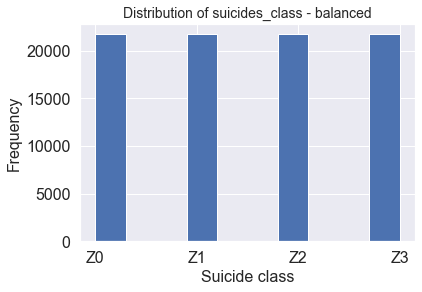

In [242]:
plt.hist(df_upsampled['suicides_class'])
plt.title("Distribution of suicides_class - balanced", fontsize=14)
plt.xlabel('Suicide class', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
#plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)
plt.show()
plt.clf()
plt.cla()
plt.close()

In [243]:
data4 = df_upsampled
data5 = data4.drop(['country','country-year','generation','suicides_no','suicides_100k_pop'], axis = 1) 
#data5 = df_upsampled.drop(['country','country-year','generation','suicides_no','suicides_100k_pop'], axis = 1) 

In [244]:
data5.head()

data5 = pd.concat([data5,pd.get_dummies(data5['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)


#Converting age into onehot encoding

data5 = pd.concat([data5,pd.get_dummies(data5['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)



data5 = pd.concat([data5,pd.get_dummies(data5['year'], prefix='year',drop_first=True)],axis=1).drop(['year'],axis=1)
data5.head()

#data3 = data3.dropna()  #Remove empty HDI

,population,HDI_for_year,gdp_for_year,gdp_per_capita,suicides_class,sex_male,age_25-34 years,age_35-54 years,age_5-14 years,age_55-74 years,...,year_2007,year_2008,year_2009,year_2010,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016
0,312900,0.0,2156624900,796,Z0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,308000,0.0,2156624900,796,Z0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,289700,0.0,2156624900,796,Z0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,21800,0.0,2156624900,796,Z0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274300,0.0,2156624900,796,Z0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [245]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data5.drop(['suicides_class'],axis=1), data5.suicides_class, test_size=0.25,random_state=5)

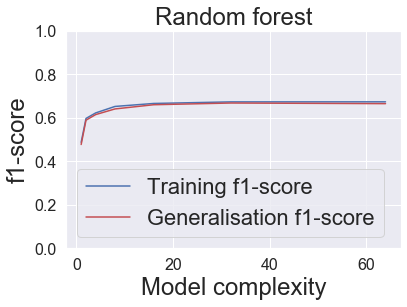

In [246]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

complexities = []
train_errors = []
test_errors = []
for n_estimators in [1,2,4,8,16,32,64]:
    clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=8)
    #sample_size = len(y_train)
    
    clf.fit(X_train, y_train)
    #train_error = 1-clf.score(X_train,y_train)#error(clf,X_train,y_train)
    
    
    
    #test_error =  1-clf.score(X_test,y_test)
    #train_error = sum(train_errors)/len(train_errors)
    #test_error = sum(test_errors)/len(test_errors)
    complexities.append(n_estimators)
    train_errors.append(f1_score(y_train, clf.predict(X_train), average='weighted'))
    test_errors.append(f1_score(y_test, clf.predict(X_test), average='weighted'))
    #print(clf.predict(X_test))
plt.plot(complexities, train_errors, c='b', label='Training f1-score')
plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
plt.ylim(0,1)
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('Random forest')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

#### Attempt to classify with all variables except year

   population  HDI_for_year  gdp_for_year  gdp_per_capita suicides_class  \
0      312900           0.0    2156624900             796             Z0   
1      308000           0.0    2156624900             796             Z0   
2      289700           0.0    2156624900             796             Z0   
3       21800           0.0    2156624900             796             Z0   
4      274300           0.0    2156624900             796             Z0   

   sex_male  age_25-34 years  age_35-54 years  age_5-14 years  \
0         1                0                0               0   
1         1                0                1               0   
2         0                0                0               0   
3         1                0                0               0   
4         1                1                0               0   

   age_55-74 years  age_75+ years  
0                0              0  
1                0              0  
2                0              0  
3       

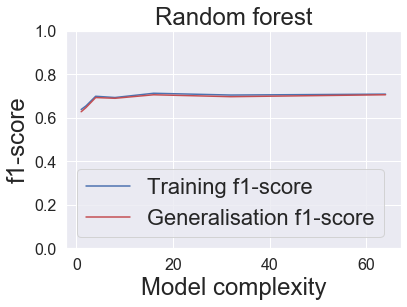

In [247]:
data5 = data4.drop(['country','country-year','generation','suicides_no','suicides_100k_pop','year'], axis = 1) 

data5.head()

data5 = pd.concat([data5,pd.get_dummies(data5['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)


#Converting age into onehot encoding

data5 = pd.concat([data5,pd.get_dummies(data5['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
print(data5.head())

#data3 = data3.dropna()  #Remove empty HDI

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data5.drop(['suicides_class'],axis=1), data5.suicides_class, test_size=0.25,random_state=5)





from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

complexities = []
train_errors = []
test_errors = []
for n_estimators in [1,2,4,8,16,32,64]:
    clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=8)
    #sample_size = len(y_train)
    
    clf.fit(X_train, y_train)
    #train_error = 1-clf.score(X_train,y_train)#error(clf,X_train,y_train)
    
    
    
    #test_error =  1-clf.score(X_test,y_test)
    #train_error = sum(train_errors)/len(train_errors)
    #test_error = sum(test_errors)/len(test_errors)
    complexities.append(n_estimators)
    train_errors.append(f1_score(y_train, clf.predict(X_train), average='weighted'))
    test_errors.append(f1_score(y_test, clf.predict(X_test), average='weighted'))
    #print(clf.predict(X_test))
plt.plot(complexities, train_errors, c='b', label='Training f1-score')
plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
plt.ylim(0,1)
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('Random forest')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

#### Attempt to classify with all variables except year, gdp_for_year  

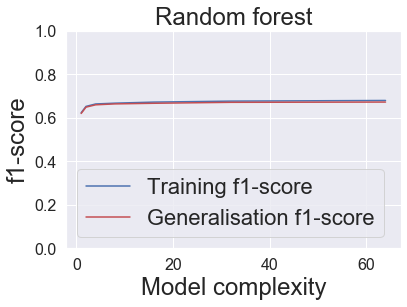

In [248]:
data5 = data4.drop(['country','country-year','generation','suicides_no','suicides_100k_pop','year','gdp_for_year'], axis = 1) 

data5.head()

data5 = pd.concat([data5,pd.get_dummies(data5['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)


#Converting age into onehot encoding

data5 = pd.concat([data5,pd.get_dummies(data5['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
data5.head()

#data3 = data3.dropna()  #Remove empty HDI

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data5.drop(['suicides_class'],axis=1), data5.suicides_class, test_size=0.25,random_state=5)





from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

complexities = []
train_errors = []
test_errors = []
for n_estimators in [1,2,4,8,16,32,64]:
    clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=8)
    #sample_size = len(y_train)
    
    clf.fit(X_train, y_train)
    #train_error = 1-clf.score(X_train,y_train)#error(clf,X_train,y_train)
    
    
    
    #test_error =  1-clf.score(X_test,y_test)
    #train_error = sum(train_errors)/len(train_errors)
    #test_error = sum(test_errors)/len(test_errors)
    complexities.append(n_estimators)
    train_errors.append(f1_score(y_train, clf.predict(X_train), average='weighted'))
    test_errors.append(f1_score(y_test, clf.predict(X_test), average='weighted'))
    #print(clf.predict(X_test))
plt.plot(complexities, train_errors, c='b', label='Training f1-score')
plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
plt.ylim(0,1)
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('Random forest')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

#### Attempt to classify with all variables except year, gdp_for_year, remove empty HDI - good result

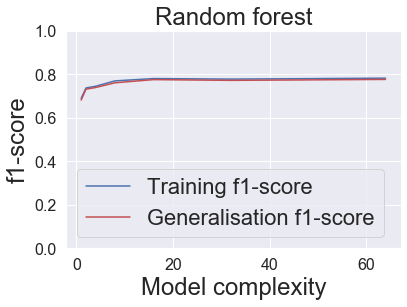

In [249]:
data5 = data4.drop(['country','country-year','generation','suicides_no','suicides_100k_pop','year','gdp_for_year'], axis = 1) 

data5.head()

data5 = pd.concat([data5,pd.get_dummies(data5['sex'], prefix='sex',drop_first=True)],axis=1).drop(['sex'],axis=1)


#Converting age into onehot encoding

data5 = pd.concat([data5,pd.get_dummies(data5['age'], prefix='age',drop_first=True)],axis=1).drop(['age'],axis=1)
data5.head()

data5 = data5[data5.HDI_for_year != 0] #Remove empty HDI

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data5.drop(['suicides_class'],axis=1), data5.suicides_class, test_size=0.25,random_state=5)





from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

complexities = []
train_errors = []
test_errors = []
for n_estimators in [1,2,4,8,16,32,64]:
    clf = RandomForestClassifier(n_estimators=n_estimators, max_depth=8)
    clf.fit(X_train, y_train)
    complexities.append(n_estimators)
    train_errors.append(f1_score(y_train, clf.predict(X_train), average='weighted'))
    test_errors.append(f1_score(y_test, clf.predict(X_test), average='weighted'))
plt.plot(complexities, train_errors, c='b', label='Training f1-score')
plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
plt.ylim(0,1)
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('Random forest')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

### Random Forest Grid Search CV

In [250]:
#tree = DecisionTreeClassifier(max_depth=2,criterion,splitter)
#_ = tree.fit(X_train, Y_train)

# Evaluate
#print('Classification report ({}):\n'.format(key))
#print(classification_report(Y_test, tree.predict(X_test)))

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pipe = Pipeline([('classifier' , RandomForestClassifier())])
param_grid = [
    {'classifier' : [RandomForestClassifier()],
     'classifier__criterion' : ['entropy', 'gini'],
    'classifier__max_depth' : [2,3,4,5,6,8,16,32,None],
     'classifier__n_estimators':[1,2,4,8,16,32,64],
     'classifier__max_features' : [6, 11, 16, 21, 26, 31]
    }
]
clf = GridSearchCV(pipe, param_grid = param_grid, cv = 5, verbose=False, n_jobs=-1,scoring='f1_macro')

# Fit on data

best_clf = clf.fit(X_train, y_train)
print("Best paramters are:")
print(best_clf.best_params_)
print("Best f1 score (training) :",best_clf.best_score_)
print("Best f1 score (validation) :",f1_score(y_test, best_clf.predict(X_test), average='macro'))




Best paramters are:
{'classifier': RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=32, max_features=6,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=64,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False), 'classifier__criterion': 'gini', 'classifier__max_depth': 32, 'classifier__max_features': 6, 'classifier__n_estimators': 64}
Best f1 score (training) : 0.9761257131990245
Best f1 score (validation) : 0.9792725028968593


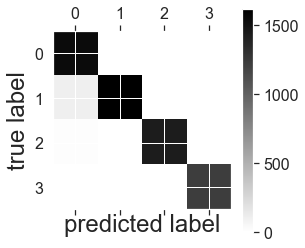

              precision    recall  f1-score   support

          Z0       1.00      0.92      0.96      1676
          Z1       0.94      1.00      0.97      1626
          Z2       0.99      1.00      0.99      1440
          Z3       1.00      1.00      1.00      1234

    accuracy                           0.98      5976
   macro avg       0.98      0.98      0.98      5976
weighted avg       0.98      0.98      0.98      5976



In [251]:
%matplotlib inline
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report
import pandas as pd
key=', '.join(['{}={}'.format(i,name) for i,name in enumerate(y_test)])
#print('Classification report ({}):\n'.format(key))
#print(confusion_matrix(best_clf.predict(X_test) , y_test ))

#y_actu = pd.Series(y_test, name='Actual')
#y_pred_s1 = pd.Series(best_clf.predict(X_test), name='Predicted')
#confusion_matrix = pd.crosstab(y_pred_s1, y_actu)
#print(confusion_matrix)

#print('Confusion matrix ({}):\n'.format(key))
_ = plt.matshow(confusion_matrix(best_clf.predict(X_test) , y_test ), cmap=plt.cm.binary, interpolation='nearest')
_ = plt.colorbar()
_ = plt.ylabel('true label')
_ = plt.xlabel('predicted label')
plt.show()
#print(confusion_matrix(best_clf.predict(X_test) , y_test ))
print(classification_report(y_test, best_clf.predict(X_test)))

### DecisionTree

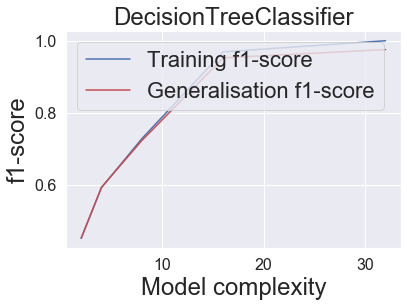

In [252]:
from sklearn.tree import DecisionTreeClassifier

complexities = []
train_errors = []
test_errors = []
for max_depth in [2,4,8,16,32,None]:
    clf = DecisionTreeClassifier(max_depth=max_depth)
    clf.fit(X_train, y_train)
    complexities.append(max_depth)
    train_errors.append(f1_score(y_train, clf.predict(X_train), average='macro'))
    test_errors.append(f1_score(y_test, clf.predict(X_test), average='macro'))
plt.plot(complexities, train_errors, c='b', label='Training f1-score')
plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
#plt.ylim(0,1)
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('DecisionTreeClassifier')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

### GridsearchCV - DecisionTree

In [253]:
#tree = DecisionTreeClassifier(max_depth=2,criterion,splitter)
#_ = tree.fit(X_train, Y_train)

# Evaluate
#print('Classification report ({}):\n'.format(key))
#print(classification_report(Y_test, tree.predict(X_test)))

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pipe = Pipeline([('classifier' , DecisionTreeClassifier())])
param_grid = [
    {'classifier' : [DecisionTreeClassifier()],
     'classifier__criterion' : ['entropy', 'gini'],
    'classifier__max_depth' : [2,3,4,5,6,8,16,32,None], #2,4,8,16,32,None
     'classifier__splitter' : ['best', 'random']
    }
]
clf = GridSearchCV(pipe, param_grid = param_grid, cv = 5, verbose=False, n_jobs=-1,scoring='f1_macro')

# Fit on data

best_clf = clf.fit(X_train, y_train)
print("Best paramters are:")
print(best_clf.best_params_)
print("Best f1 score (training) :",best_clf.best_score_)
print("Best f1 score (validation) :",f1_score(y_test, best_clf.predict(X_test), average='macro'))

Best paramters are:
{'classifier': DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=32, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best'), 'classifier__criterion': 'entropy', 'classifier__max_depth': 32, 'classifier__splitter': 'best'}
Best f1 score (training) : 0.9703704436944527
Best f1 score (validation) : 0.978946377782008


### KNeighborsClassifier

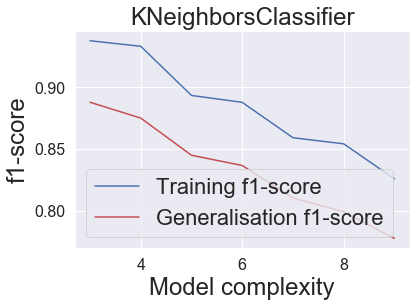

In [254]:
from sklearn.neighbors import KNeighborsClassifier

complexities = []
train_errors = []
test_errors = []
for neighbour in range(3,10):
    clf = KNeighborsClassifier(n_neighbors=neighbour)#DecisionTreeClassifier(max_depth=max_depth)
    clf.fit(X_train, y_train)
    complexities.append(neighbour)
    train_errors.append(f1_score(y_train, clf.predict(X_train), average='macro'))
    test_errors.append(f1_score(y_test, clf.predict(X_test), average='macro'))
plt.plot(complexities, train_errors, c='b', label='Training f1-score')
plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
#plt.ylim(0,1)
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('KNeighborsClassifier')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

### KNeighborsClassifier GridsearchCV

In [255]:
k_range = list(range(1, 31))
print(k_range)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]


In [256]:
#tree = DecisionTreeClassifier(max_depth=2,criterion,splitter)
#_ = tree.fit(X_train, Y_train)

# Evaluate
#print('Classification report ({}):\n'.format(key))
#print(classification_report(Y_test, tree.predict(X_test)))

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pipe = Pipeline([('classifier' , KNeighborsClassifier())])
param_grid = [
    {'classifier' : [KNeighborsClassifier()],
     'classifier__n_neighbors' :k_range,
     'classifier__weights':['uniform','distance'],
'classifier__metric':['euclidean','manhattan'],
    }
]
clf = GridSearchCV(pipe, param_grid = param_grid, cv = 5, verbose=False, n_jobs=-1,scoring='f1_macro')

# Fit on data

best_clf = clf.fit(X_train, y_train)
print("Best paramters are:")
print(best_clf.best_params_)
print("Best f1 score (training) :",best_clf.best_score_)
print("Best f1 score (validation) :",f1_score(y_test, best_clf.predict(X_test), average='macro'))

Best paramters are:
{'classifier': KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform'), 'classifier__metric': 'manhattan', 'classifier__n_neighbors': 1, 'classifier__weights': 'uniform'}
Best f1 score (training) : 0.9241135851269228
Best f1 score (validation) : 0.9379168064318613


### LinearSVC

No handles with labels found to put in legend.


0.18632431670023636
0.18445248369170325


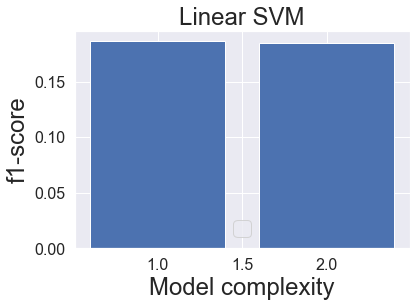

In [257]:
#from sklearn import svm
from sklearn.svm import LinearSVC
clf = LinearSVC(random_state=0, tol=1e-5)#DecisionTreeClassifier(max_depth=max_depth)
clf.fit(X_train, y_train)
    #complexities.append(neighbour)
train_err = f1_score(y_train, clf.predict(X_train), average='macro')
test_err = f1_score(y_test, clf.predict(X_test), average='macro')
#plt.plot(complexities, train_errors, c='b', label='Training f1-score')
#plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
#plt.ylim(0,1)
print(train_err)
print(test_err)
plt.bar([1,2],[train_err,test_err])
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('Linear SVM')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

### LinearSVC GridSearch

In [258]:
#tree = DecisionTreeClassifier(max_depth=2,criterion,splitter)
#_ = tree.fit(X_train, Y_train)

# Evaluate
#print('Classification report ({}):\n'.format(key))
#print(classification_report(Y_test, tree.predict(X_test)))

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pipe = Pipeline([('classifier' , LinearSVC())])
param_grid = [
    {'classifier' : [LinearSVC()],
     'classifier__C' :np.arange(0.01,100,10)
    }
]
clf = GridSearchCV(pipe, param_grid = param_grid, cv = 5, verbose=False, n_jobs=-1,scoring='f1_macro')

# Fit on data

best_clf = clf.fit(X_train, y_train)
print("Best paramters are:")
print(best_clf.best_params_)
print("Best f1 score (training) :",best_clf.best_score_)
print("Best f1 score (validation) :",f1_score(y_test, best_clf.predict(X_test), average='macro'))

Best paramters are:
{'classifier': LinearSVC(C=40.01, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0), 'classifier__C': 40.01}
Best f1 score (training) : 0.17110551659262768
Best f1 score (validation) : 0.1751044348375188


### LogisticRegression

No handles with labels found to put in legend.


0.10524925136515767
0.1069455406471981


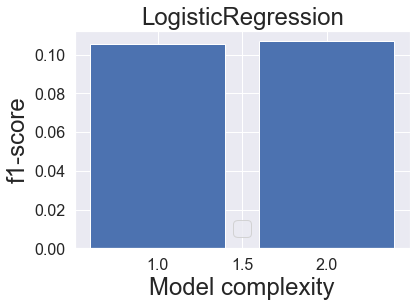

In [259]:
from sklearn.linear_model import LogisticRegression
clf =LogisticRegression()#DecisionTreeClassifier(max_depth=max_depth)
clf.fit(X_train, y_train)
    #complexities.append(neighbour)
train_err = f1_score(y_train, clf.predict(X_train), average='macro')
test_err = f1_score(y_test, clf.predict(X_test), average='macro')
#plt.plot(complexities, train_errors, c='b', label='Training f1-score')
#plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
#plt.ylim(0,1)
print(train_err)
print(test_err)
plt.bar([1,2],[train_err,test_err])
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('LogisticRegression')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

### LogisticRegression GridSearch

In [260]:
#tree = DecisionTreeClassifier(max_depth=2,criterion,splitter)
#_ = tree.fit(X_train, Y_train)

# Evaluate
#print('Classification report ({}):\n'.format(key))
#print(classification_report(Y_test, tree.predict(X_test)))

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pipe = Pipeline([('classifier' , LogisticRegression())])
param_grid = [
    {'classifier' : [LogisticRegression()],
     'classifier__penalty' : ['l1', 'l2'],
    'classifier__C' : np.logspace(-4, 4, 20),
    'classifier__solver' : ['liblinear']}
]
clf = GridSearchCV(pipe, param_grid = param_grid, cv = 5, verbose=False, n_jobs=-1,scoring='f1_macro')

# Fit on data

best_clf = clf.fit(X_train, y_train)
print("Best paramters are:")
print(best_clf.best_params_)
print("Best f1 score (training) :",best_clf.best_score_)
print("Best f1 score (validation) :",f1_score(y_test, best_clf.predict(X_test), average='macro'))

Best paramters are:
{'classifier': LogisticRegression(C=1438.44988828766, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False), 'classifier__C': 1438.44988828766, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}
Best f1 score (training) : 0.5741642486638711
Best f1 score (validation) : 0.578514738240404


### LinearDiscriminant

No handles with labels found to put in legend.


0.5737157838776341
0.5785479757261687


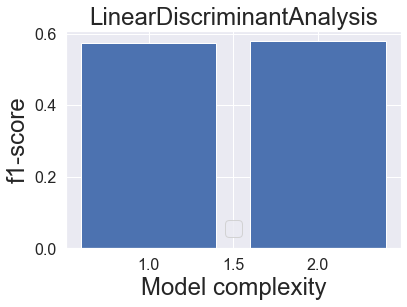

In [261]:
import numpy as np
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

clf = LinearDiscriminantAnalysis()
clf.fit(X_train, y_train)
    #complexities.append(neighbour)
train_err = f1_score(y_train, clf.predict(X_train), average='macro')
test_err = f1_score(y_test, clf.predict(X_test), average='macro')
#plt.plot(complexities, train_errors, c='b', label='Training f1-score')
#plt.plot(complexities, test_errors, c='r', label='Generalisation f1-score')
#plt.ylim(0,1)
print(train_err)
print(test_err)
plt.bar([1,2],[train_err,test_err])
plt.ylabel('f1-score')
plt.xlabel('Model complexity')
plt.title('LinearDiscriminantAnalysis')
plt.legend()
plt.show()
plt.clf()
plt.cla()
plt.close()

### LinearDiscriminant GridSearchCV

In [262]:
#tree = DecisionTreeClassifier(max_depth=2,criterion,splitter)
#_ = tree.fit(X_train, Y_train)

# Evaluate
#print('Classification report ({}):\n'.format(key))
#print(classification_report(Y_test, tree.predict(X_test)))

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
pipe = Pipeline([('classifier' , LinearDiscriminantAnalysis())])
param_grid = [
    {'classifier' : [LinearDiscriminantAnalysis()],
     'classifier__solver' : ['svd', 'lsqr','eigen'],
    'classifier__shrinkage' : [None,'auto']
    }
]



clf = GridSearchCV(pipe, param_grid = param_grid, cv = 5, verbose=False, n_jobs=-1,scoring='f1_macro')

# Fit on data

best_clf = clf.fit(X_train, y_train)
print("Best paramters are:")
print(best_clf.best_params_)
print("Best f1 score (training) :",best_clf.best_score_)
print("Best f1 score (validation) :",f1_score(y_test, best_clf.predict(X_test), average='macro'))

Best paramters are:
{'classifier': LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001), 'classifier__shrinkage': None, 'classifier__solver': 'svd'}
Best f1 score (training) : 0.5753254310181656
Best f1 score (validation) : 0.5785479757261687


### Cross Validation scores

In [263]:
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

scoring_func = "f1_macro"  #'f1_weighted'

#train_test_split(data5.drop(['suicides_class'],axis=1), data5.suicides_class, test_size=0.25,random_state=5)
clf = LinearDiscriminantAnalysis(shrinkage=None, solver='svd')
scores_lda = cross_val_score(clf, data5.drop(['suicides_class'],axis=1), data5.suicides_class, cv=10, scoring=scoring_func)

from sklearn.ensemble import RandomForestClassifier
clf2 = RandomForestClassifier(criterion= 'gini', max_depth=None, max_features=6, n_estimators=32)
scores_randfor = cross_val_score(clf2, data5.drop(['suicides_class'],axis=1), data5.suicides_class, cv=10, scoring=scoring_func)

#'classifier__criterion': 'entropy', 'classifier__max_depth': 32, 'classifier__max_features': 6, 'classifier__n_estimators': 32}

from sklearn.tree import DecisionTreeClassifier
clf3 = DecisionTreeClassifier(criterion= 'entropy', max_depth=None,splitter='best')
scores_tree = cross_val_score(clf3, data5.drop(['suicides_class'],axis=1), data5.suicides_class, cv=10, scoring=scoring_func)


from sklearn.neighbors import KNeighborsClassifier
clf4 = KNeighborsClassifier(metric='manhattan',n_neighbors=1, weights='uniform')
scores_knn = cross_val_score(clf4, data5.drop(['suicides_class'],axis=1), data5.suicides_class, cv=10, scoring=scoring_func)

from sklearn.svm import LinearSVC
clf5 = LinearSVC(C=0.01)
scores_linsvc = cross_val_score(clf5, data5.drop(['suicides_class'],axis=1), data5.suicides_class, cv=10, scoring=scoring_func)

from sklearn.linear_model import LogisticRegression
clf6 = LogisticRegression(C=206.913808111479,penalty='l1',solver='liblinear')
scores_log = cross_val_score(clf6, data5.drop(['suicides_class'],axis=1), data5.suicides_class, cv=10, scoring=scoring_func)

#C': 206.913808111479, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear'}



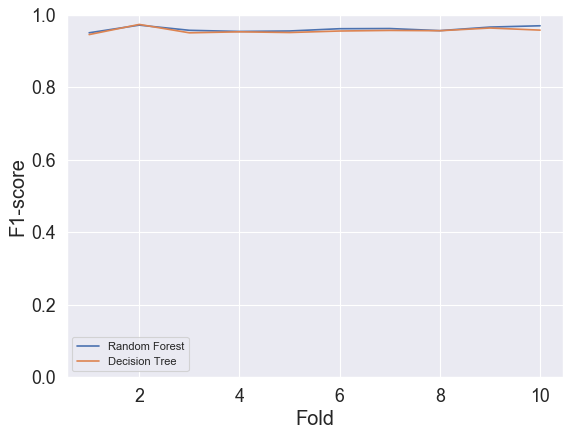

In [264]:
x_val = list(range(1,11))
from matplotlib.pyplot import figure
figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
axes = plt.gca()
#axes.set_xlim([xmin,xmax])
axes.set_ylim([0,1])
#plt.plot(x_val, scores_lda,label="LDA")
plt.plot(x_val, scores_randfor,label="Random Forest")
plt.plot(x_val, scores_tree,label="Decision Tree")
#plt.plot(x_val, scores_knn,label="kNN")
#plt.plot(x_val, scores_linsvc,label="Linear SVC")
#plt.plot(x_val, scores_log,label="Logistic Regression")

plt.xlabel('Fold', fontsize=18)
plt.ylabel('F1-score', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=18)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()

### Individual students T test

In [265]:
'{:.10f}'.format(stats.ttest_rel(scores_randfor, scores_tree).pvalue*0.5)

'0.0042989908'

In [266]:
'{:.18f}'.format(stats.ttest_rel(scores_randfor, scores_lda).pvalue*0.5)

'0.000000000000012459'

In [267]:
'{:.10f}'.format(stats.ttest_rel(scores_randfor, scores_knn).pvalue*0.5)

'0.0000004404'

In [268]:
'{:.18f}'.format(stats.ttest_rel(scores_randfor, scores_linsvc).pvalue*0.5)

'0.000000000000036841'

In [269]:
'{:.18f}'.format(stats.ttest_rel(scores_randfor, scores_log).pvalue*0.5)

'0.000000000000158375'

### Comparison of various classifers

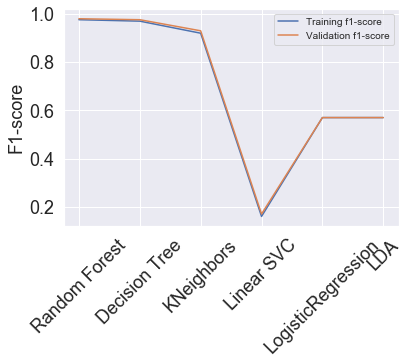

In [270]:
trainf1= [0.976,0.97,0.92,0.16,0.57,0.57]
validationf1 = [0.98,0.976,0.93,0.17,0.57,0.57]


x = np.array([0,1,2,3,4,5])
my_xticks = ['Random Forest','Decision Tree','KNeighbors','Linear SVC','LogisticRegression','LDA']
plt.xticks(x, my_xticks,rotation=45)

plt.plot(x,trainf1,label="Training f1-score")
plt.plot(x,validationf1,label="Validation f1-score")
#plt.plot(x_val, scores_knn,label="kNN")
#plt.plot(x_val, scores_linsvc,label="Linear SVC")
#plt.plot(x_val, scores_log,label="Logistic Regression")

#plt.xlabel('Fold', fontsize=18)
plt.ylabel('F1-score', fontsize=18)
plt.legend(fontsize='medium')
plt.rc('xtick',labelsize=10)
plt.rc('ytick',labelsize=18)
plt.show()
plt.clf()
plt.cla()
plt.close()